In [1]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

# Preprocessing

In [2]:
white = pd.read_csv('./data/wine/winequality-white.csv', sep = ';')
red = pd.read_csv('./data/wine/winequality-red.csv', sep = ';')

data = pd.concat([white, red], ignore_index=True)
    

In [3]:
data.loc[data['quality'] >= 5, 'quality_note'] = 1
data.loc[data['quality'] < 5, 'quality_note'] = 0
data = data.drop(columns=['quality'])

In [4]:
data.quality_note.value_counts()

1.0    6251
0.0     246
Name: quality_note, dtype: int64

In [5]:
data.shape

(6497, 12)

In [6]:
data_cols = list(data.columns[ data.columns != 'quality_note' ])
label_cols = ['quality_note']
data[label_cols] = data[label_cols].astype('int')

In [7]:
#Standardize columns
data[data_cols] = StandardScaler().fit(data[data_cols]).transform(data[data_cols])

In [37]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")
    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [40]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100 
base_n_count = 30 

nb_steps = 50000+1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100  # number of steps to pre-train the critic before starting adversarial training
log_interval = 100 #  interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 
data_dir = './cache/wine/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy().reset_index(drop=True)

train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

Using TensorFlow backend.


data_dim:  11
data_cols:  ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
label_dim:  1
label_cols:  ['quality_note']
Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 101)          0           input_1[0][0]              

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.6671, 0.7270, 0.6858
D Real - D Gen: -0.0412


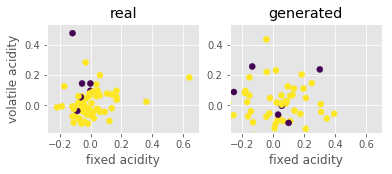

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.6723, 0.7016, 0.6479
D Real - D Gen: -0.0537


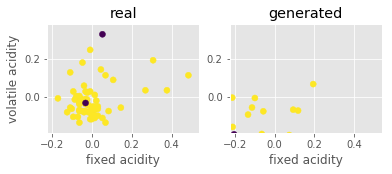

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.6483, 0.7240, 0.6355
D Real - D Gen: -0.0886


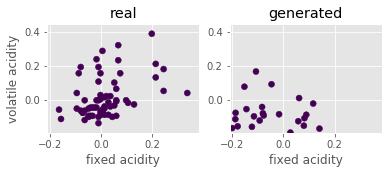

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.6422, 0.7332, 0.6428
D Real - D Gen: -0.0905


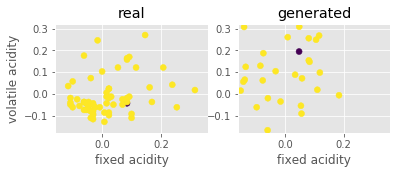

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.7158, 0.6359
D Real - D Gen: -0.0800


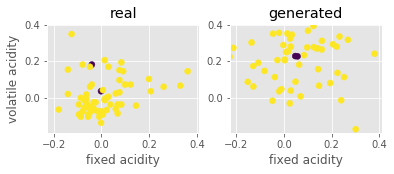

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.6639, 0.7004, 0.6498
D Real - D Gen: -0.0505


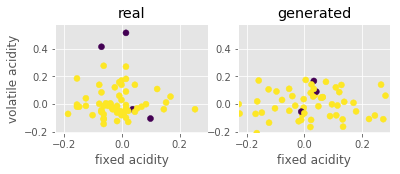

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.6901, 0.6633
D Real - D Gen: -0.0267


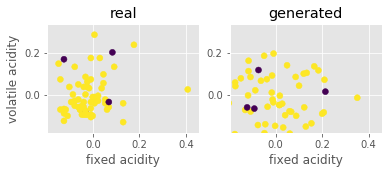

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.6570, 0.6926, 0.6695
D Real - D Gen: -0.0231


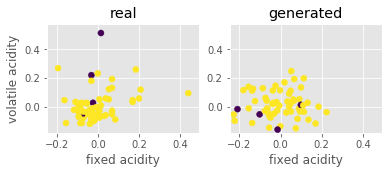

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.6518, 0.6993, 0.6643
D Real - D Gen: -0.0350


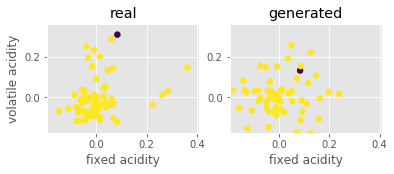

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.6609, 0.6985, 0.6705
D Real - D Gen: -0.0279


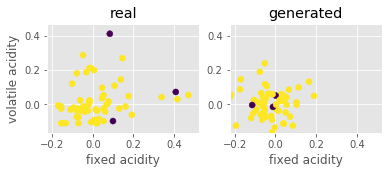

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.6945, 0.6743
D Real - D Gen: -0.0202


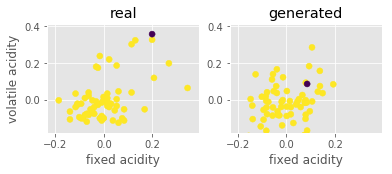

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.6981, 0.6745
D Real - D Gen: -0.0237


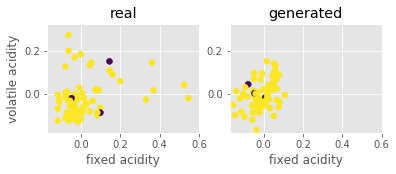

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.6696, 0.6924, 0.6845
D Real - D Gen: -0.0079


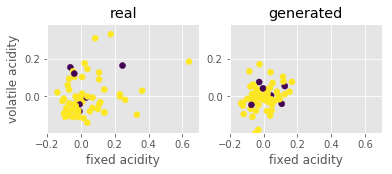

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.6664, 0.6947, 0.6772
D Real - D Gen: -0.0175


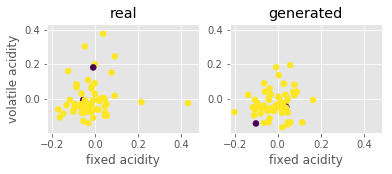

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.6697, 0.6992, 0.6886
D Real - D Gen: -0.0106


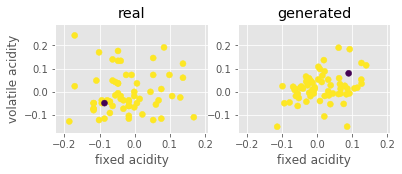

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.6752, 0.6911, 0.6824
D Real - D Gen: -0.0087


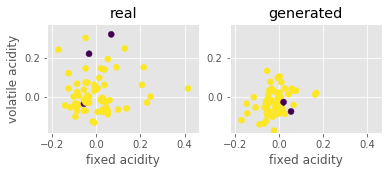

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.6699, 0.6931, 0.6824
D Real - D Gen: -0.0107


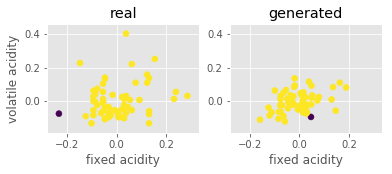

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.6718, 0.6885, 0.6834
D Real - D Gen: -0.0051


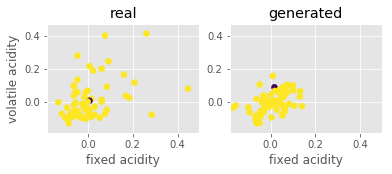

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.6767, 0.6881, 0.6795
D Real - D Gen: -0.0086


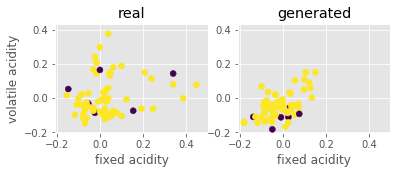

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 0.6761, 0.6879, 0.6812
D Real - D Gen: -0.0067


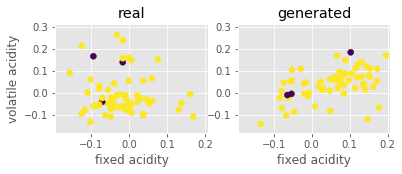

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.6813, 0.6874, 0.6839
D Real - D Gen: -0.0035


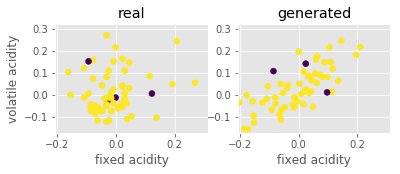

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.6737, 0.6894, 0.6823
D Real - D Gen: -0.0071


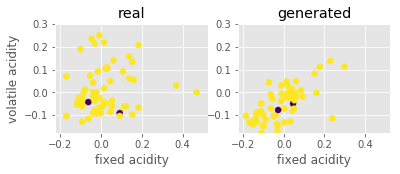

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.6787, 0.6854, 0.6788
D Real - D Gen: -0.0066


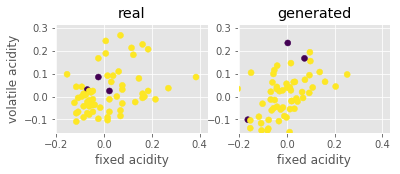

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.6754, 0.6875, 0.6887
D Real - D Gen: 0.0012


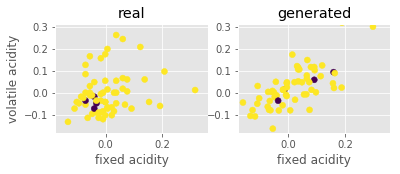

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.6797, 0.6856, 0.6834
D Real - D Gen: -0.0022


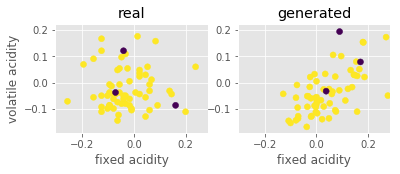

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.6700, 0.6941, 0.6851
D Real - D Gen: -0.0090


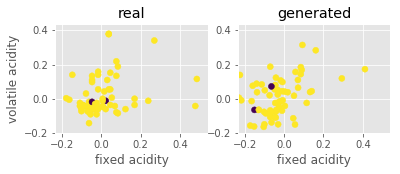

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 0.6837, 0.6745, 0.6863
D Real - D Gen: 0.0119


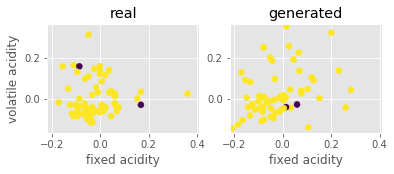

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 0.6727, 0.6865, 0.6847
D Real - D Gen: -0.0017


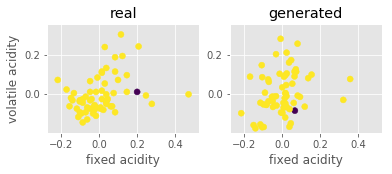

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 0.6791, 0.6844, 0.6800
D Real - D Gen: -0.0044


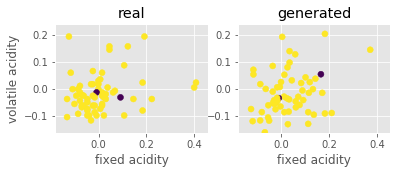

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.6739, 0.6868, 0.6771
D Real - D Gen: -0.0097


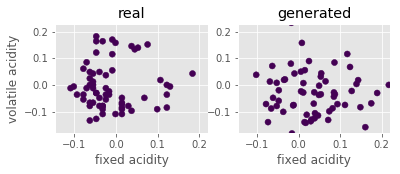

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.6637, 0.7098, 0.6781
D Real - D Gen: -0.0318


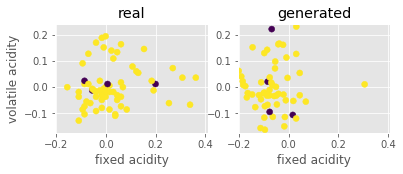

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.6792, 0.6821, 0.6776
D Real - D Gen: -0.0046


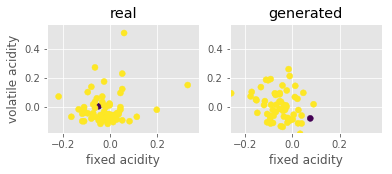

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 0.6801, 0.6872, 0.6910
D Real - D Gen: 0.0039


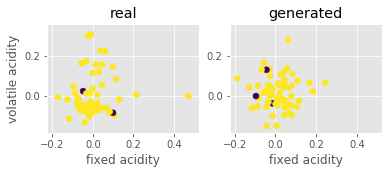

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 0.6686, 0.6946, 0.6814
D Real - D Gen: -0.0132


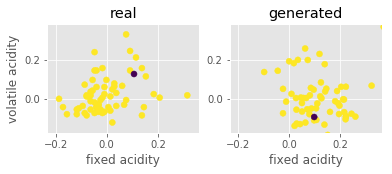

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 0.6842, 0.6818, 0.6813
D Real - D Gen: -0.0005


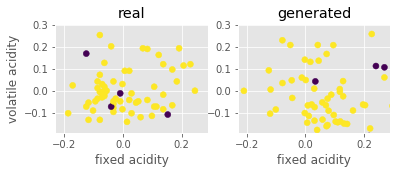

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 0.6670, 0.7025, 0.6760
D Real - D Gen: -0.0265


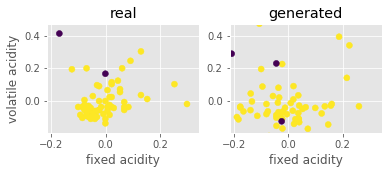

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.6656, 0.6970, 0.6698
D Real - D Gen: -0.0272


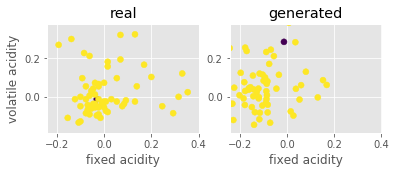

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.6930, 0.6730, 0.6837
D Real - D Gen: 0.0107


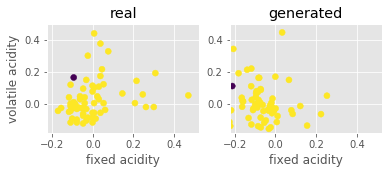

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.6616, 0.7011, 0.6825
D Real - D Gen: -0.0186


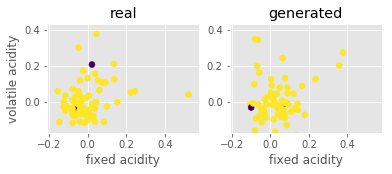

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.6855, 0.6806, 0.6675
D Real - D Gen: -0.0132


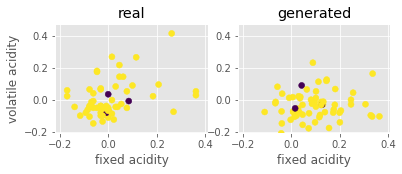

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.6603, 0.6943, 0.6724
D Real - D Gen: -0.0219


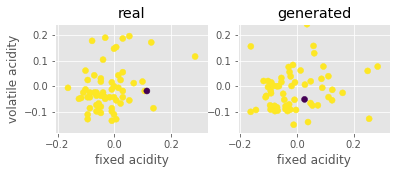

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.6565, 0.7103, 0.6694
D Real - D Gen: -0.0409


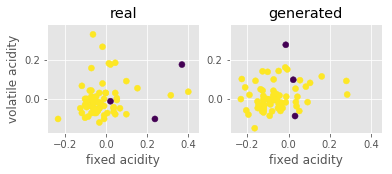

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.6919, 0.6741, 0.6787
D Real - D Gen: 0.0046


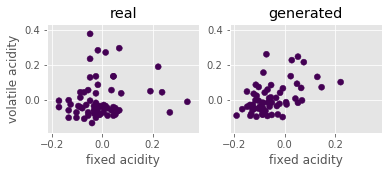

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.6539, 0.7058, 0.6760
D Real - D Gen: -0.0297


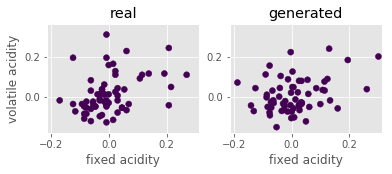

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.6641, 0.6890, 0.6783
D Real - D Gen: -0.0106


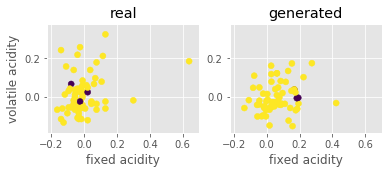

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.6728, 0.7030, 0.6789
D Real - D Gen: -0.0242


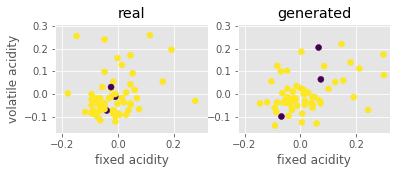

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.6732, 0.6891, 0.6814
D Real - D Gen: -0.0077


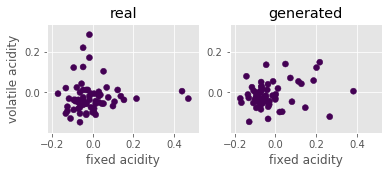

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.6881, 0.6811, 0.6830
D Real - D Gen: 0.0019


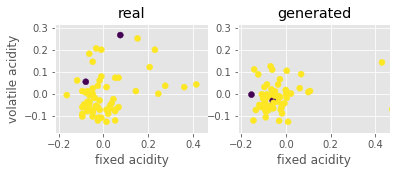

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.6795, 0.6893, 0.6771
D Real - D Gen: -0.0122


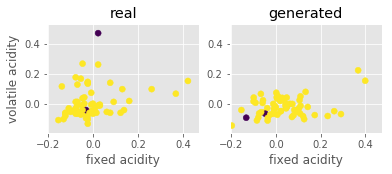

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.6901, 0.6816, 0.6718
D Real - D Gen: -0.0098


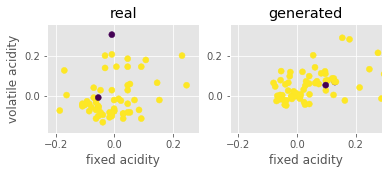

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.6722, 0.6924, 0.6759
D Real - D Gen: -0.0165


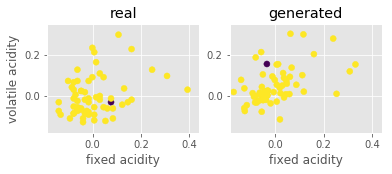

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.6915, 0.6856, 0.6775
D Real - D Gen: -0.0081


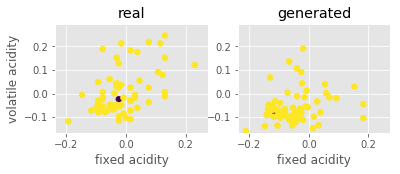

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6905, 0.6771
D Real - D Gen: -0.0135


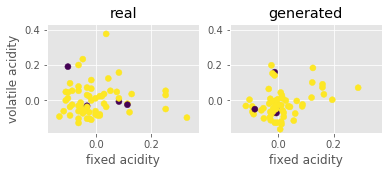

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.6821, 0.6759, 0.6636
D Real - D Gen: -0.0123


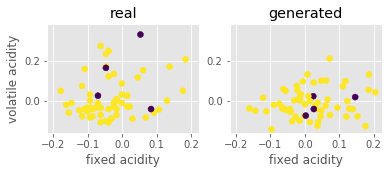

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.6808, 0.6958, 0.6641
D Real - D Gen: -0.0317


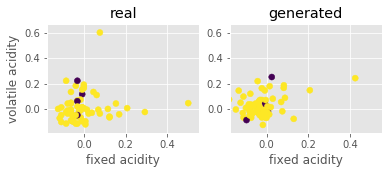

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.6863, 0.6801, 0.6826
D Real - D Gen: 0.0025


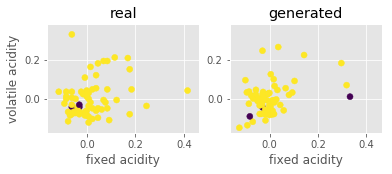

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.6746, 0.6963, 0.6710
D Real - D Gen: -0.0253


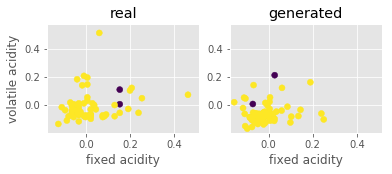

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.6704, 0.6972, 0.6672
D Real - D Gen: -0.0301


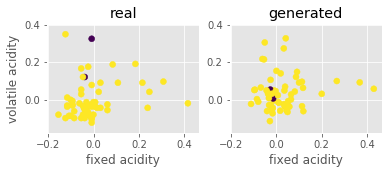

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.6973, 0.6817, 0.6778
D Real - D Gen: -0.0039


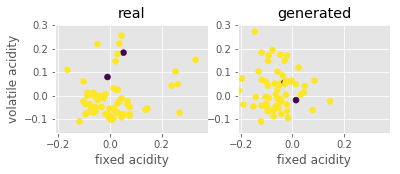

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.6833, 0.6842, 0.6748
D Real - D Gen: -0.0095


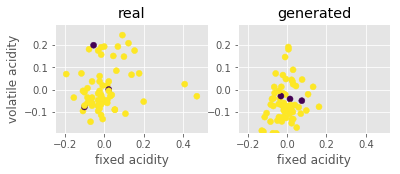

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.6976, 0.6826, 0.6705
D Real - D Gen: -0.0121


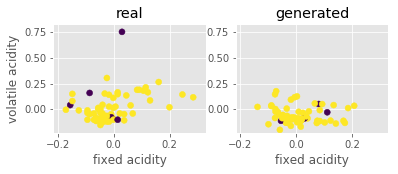

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.6988, 0.6737, 0.6752
D Real - D Gen: 0.0015


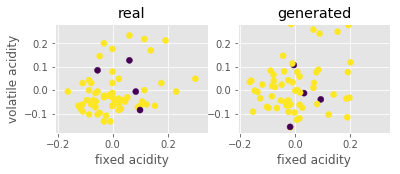

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.6851, 0.6983, 0.6783
D Real - D Gen: -0.0200


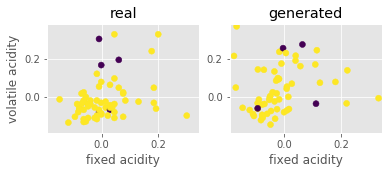

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.7047, 0.6868, 0.6656
D Real - D Gen: -0.0212


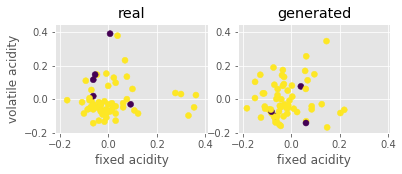

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.6837, 0.7098, 0.6730
D Real - D Gen: -0.0368


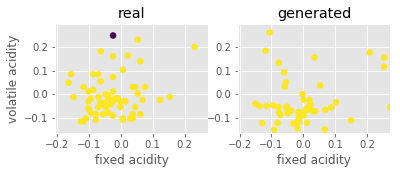

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.7237, 0.6737, 0.6891
D Real - D Gen: 0.0153


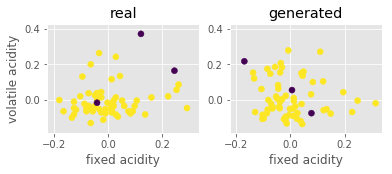

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.7031, 0.6905, 0.6793
D Real - D Gen: -0.0112


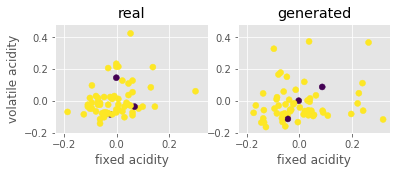

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.6596, 0.6784, 0.6666
D Real - D Gen: -0.0118


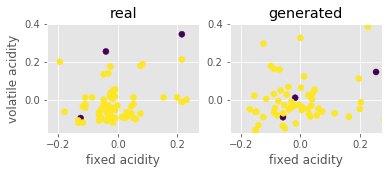

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6794, 0.6813
D Real - D Gen: 0.0019


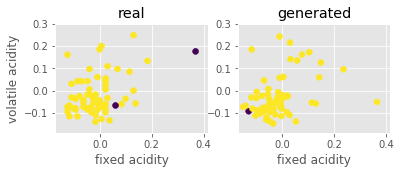

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.6710, 0.6679, 0.6868
D Real - D Gen: 0.0188


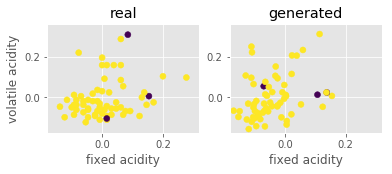

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.6594, 0.6812, 0.6815
D Real - D Gen: 0.0003


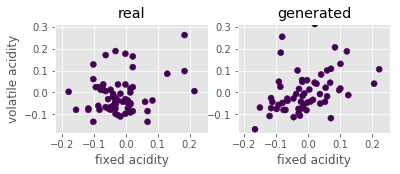

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.6632, 0.6876, 0.6730
D Real - D Gen: -0.0146


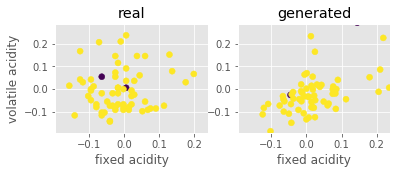

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.6730, 0.6664, 0.6710
D Real - D Gen: 0.0045


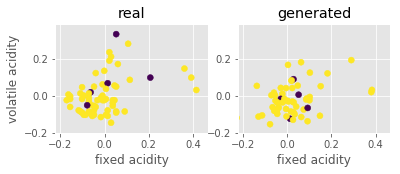

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.6459, 0.6877, 0.6735
D Real - D Gen: -0.0142


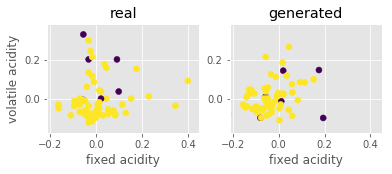

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.6648, 0.6760, 0.6739
D Real - D Gen: -0.0021


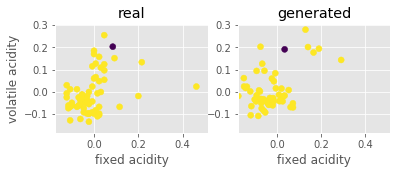

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.6580, 0.6897, 0.6887
D Real - D Gen: -0.0010


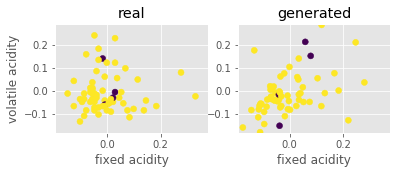

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.6770, 0.6781
D Real - D Gen: 0.0011


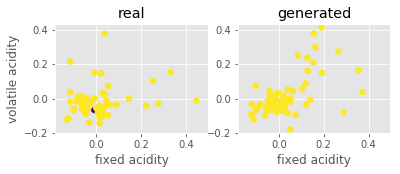

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.6586, 0.6791, 0.6783
D Real - D Gen: -0.0008


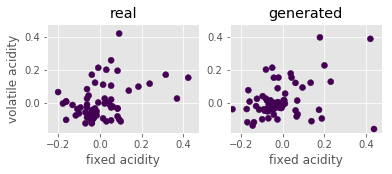

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.6544, 0.6919, 0.6795
D Real - D Gen: -0.0124


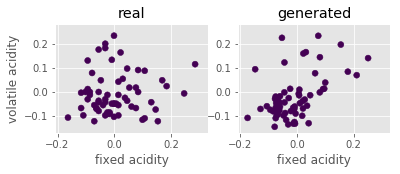

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.6620, 0.6706, 0.6850
D Real - D Gen: 0.0144


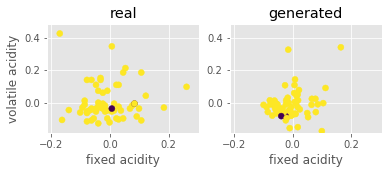

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.6685, 0.6705, 0.6834
D Real - D Gen: 0.0130


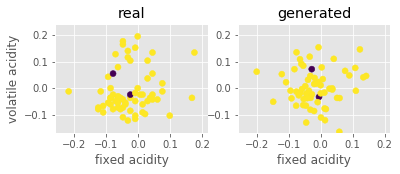

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 0.6741, 0.6793, 0.6657
D Real - D Gen: -0.0136


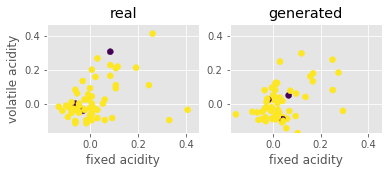

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.6645, 0.6801, 0.6812
D Real - D Gen: 0.0011


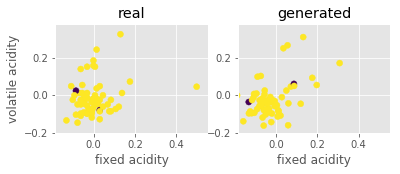

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.6786, 0.6751, 0.6913
D Real - D Gen: 0.0163


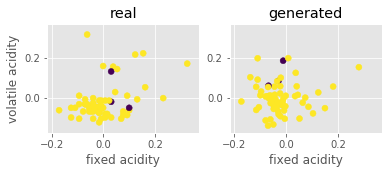

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.6636, 0.6736, 0.6809
D Real - D Gen: 0.0073


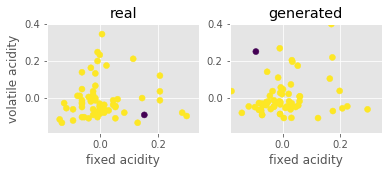

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 0.6642, 0.6713, 0.6816
D Real - D Gen: 0.0103


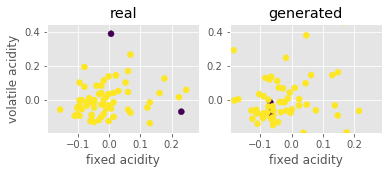

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.6624, 0.6680, 0.6800
D Real - D Gen: 0.0120


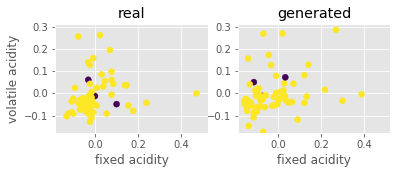

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.6671, 0.6621, 0.6881
D Real - D Gen: 0.0260


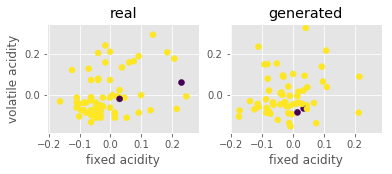

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.6795, 0.6825
D Real - D Gen: 0.0030


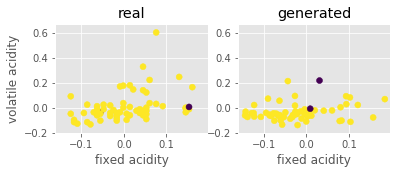

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 0.6743, 0.6789, 0.6792
D Real - D Gen: 0.0002


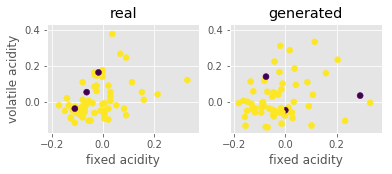

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.6707, 0.6700, 0.6785
D Real - D Gen: 0.0084


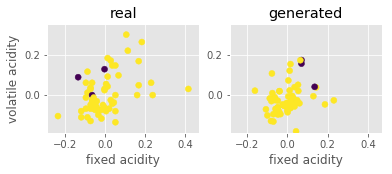

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.6713, 0.6796, 0.6699
D Real - D Gen: -0.0097


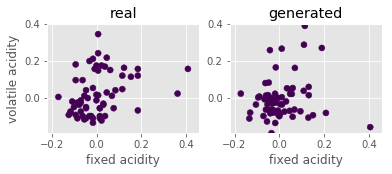

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.6778, 0.6750, 0.6728
D Real - D Gen: -0.0022


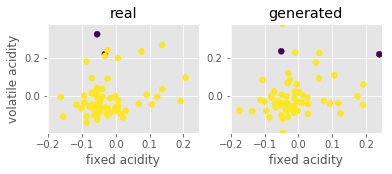

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 0.6684, 0.6741, 0.6823
D Real - D Gen: 0.0082


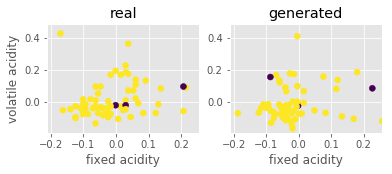

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.6838, 0.6750
D Real - D Gen: -0.0088


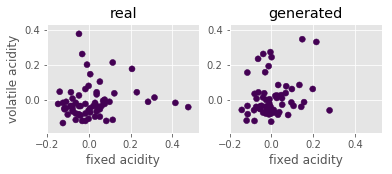

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.6645, 0.6786, 0.6688
D Real - D Gen: -0.0098


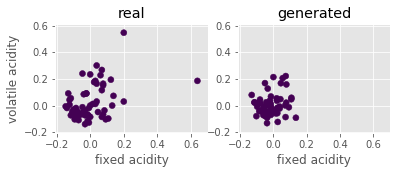

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.6709, 0.6726, 0.6678
D Real - D Gen: -0.0048


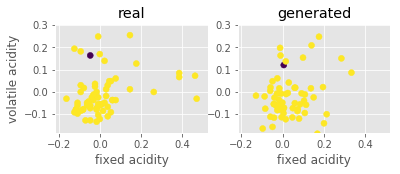

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.6761, 0.6797, 0.6780
D Real - D Gen: -0.0017


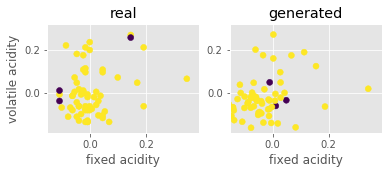

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.6887, 0.6752, 0.6714
D Real - D Gen: -0.0038


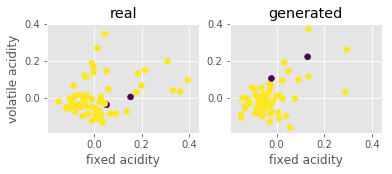

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.6762, 0.6924, 0.6757
D Real - D Gen: -0.0167


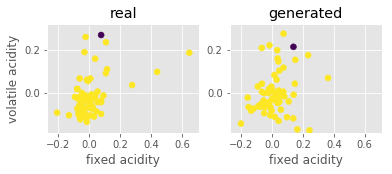

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.6681, 0.6784, 0.6814
D Real - D Gen: 0.0030


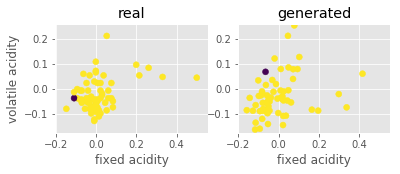

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.6796, 0.6686, 0.6674
D Real - D Gen: -0.0012


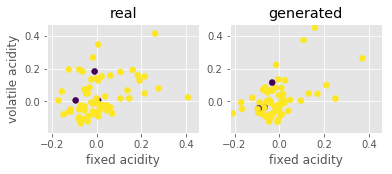

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.6673, 0.6736, 0.6811
D Real - D Gen: 0.0075


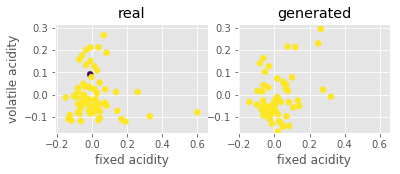

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.6716, 0.6782, 0.6760
D Real - D Gen: -0.0021


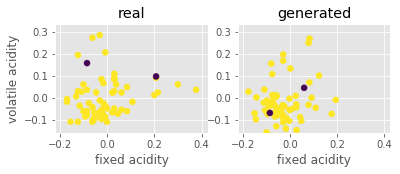

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.6840, 0.6867, 0.6693
D Real - D Gen: -0.0174


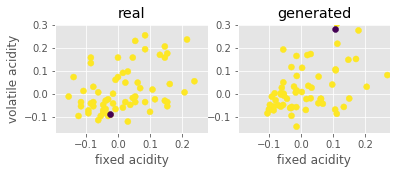

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 0.6774, 0.6795, 0.6775
D Real - D Gen: -0.0019


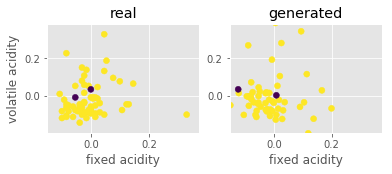

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.6724, 0.6807, 0.6855
D Real - D Gen: 0.0048


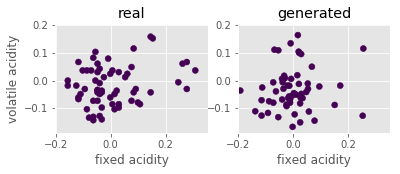

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.6743, 0.6887, 0.6805
D Real - D Gen: -0.0082


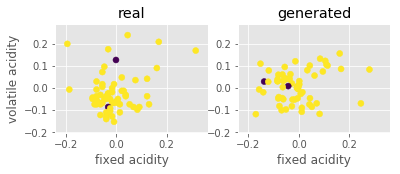

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.6854, 0.6805, 0.6716
D Real - D Gen: -0.0088


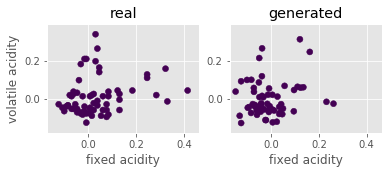

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.6774, 0.6654, 0.6823
D Real - D Gen: 0.0169


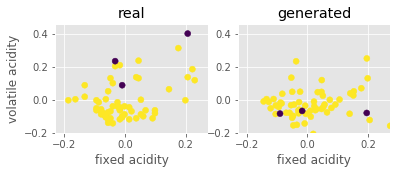

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.6924, 0.6629, 0.6928
D Real - D Gen: 0.0298


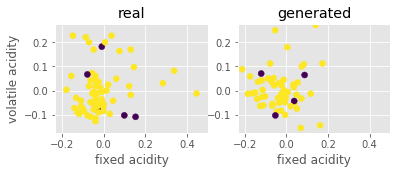

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.6729, 0.6660, 0.6825
D Real - D Gen: 0.0165


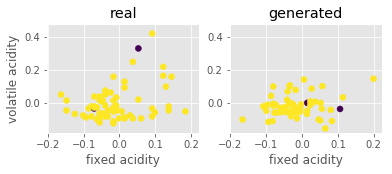

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.6904, 0.6839, 0.6829
D Real - D Gen: -0.0011


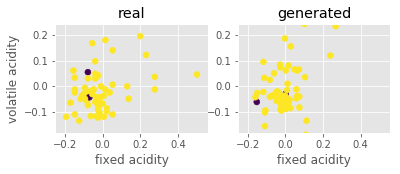

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 0.7024, 0.6786, 0.6738
D Real - D Gen: -0.0048


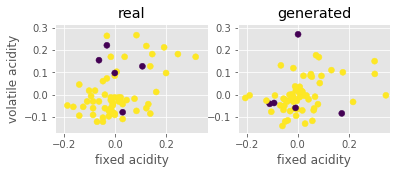

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 0.6649, 0.6919, 0.6704
D Real - D Gen: -0.0214


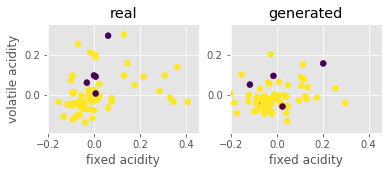

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.6824, 0.6652, 0.6770
D Real - D Gen: 0.0118


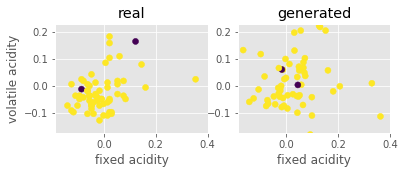

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.6847, 0.6743, 0.6715
D Real - D Gen: -0.0028


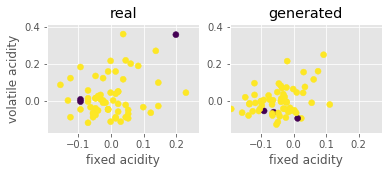

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.6886, 0.6833, 0.6797
D Real - D Gen: -0.0037


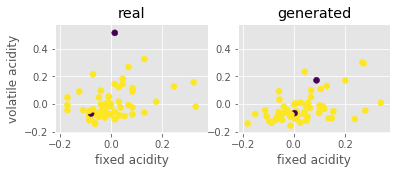

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.6798, 0.6626, 0.6691
D Real - D Gen: 0.0065


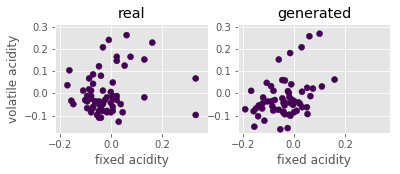

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.6935, 0.6755, 0.6615
D Real - D Gen: -0.0140


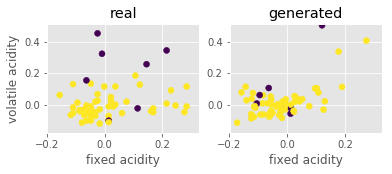

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.6944, 0.6816, 0.6848
D Real - D Gen: 0.0031


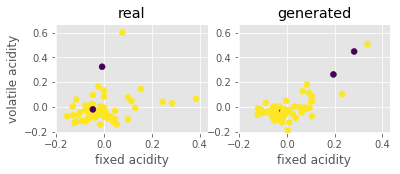

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.7023, 0.6840, 0.6770
D Real - D Gen: -0.0071


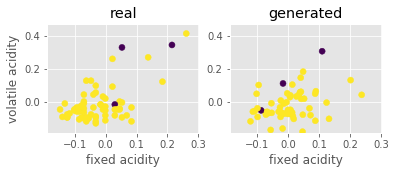

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.6911, 0.6794, 0.6901
D Real - D Gen: 0.0107


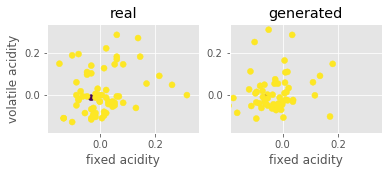

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 0.6978, 0.6653, 0.6781
D Real - D Gen: 0.0128


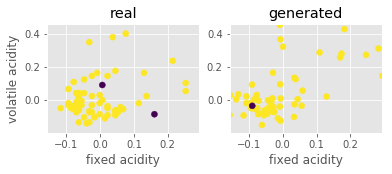

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.6897, 0.6892, 0.6777
D Real - D Gen: -0.0115


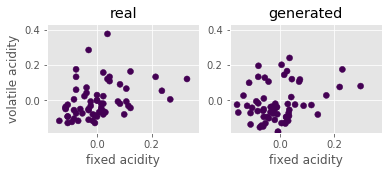

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.6899, 0.6725, 0.6768
D Real - D Gen: 0.0043


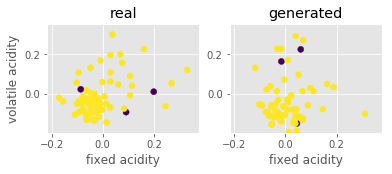

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 0.6912, 0.6761, 0.6648
D Real - D Gen: -0.0113


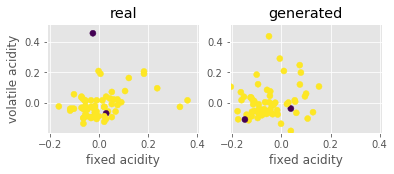

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.7106, 0.6650, 0.6788
D Real - D Gen: 0.0137


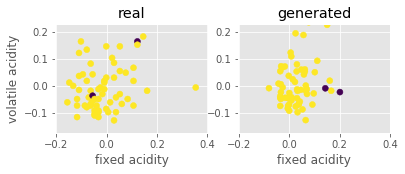

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 0.7023, 0.6758, 0.6707
D Real - D Gen: -0.0051


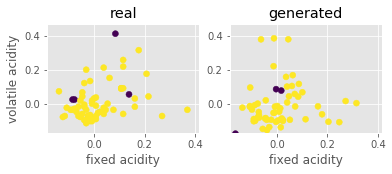

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.6839, 0.6835, 0.6797
D Real - D Gen: -0.0039


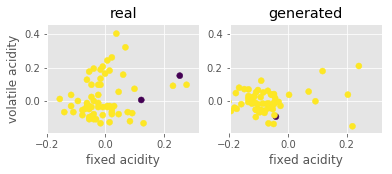

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 0.6852, 0.6781, 0.6920
D Real - D Gen: 0.0139


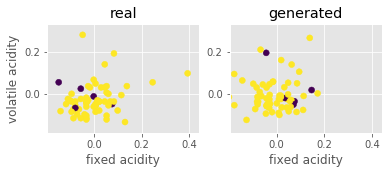

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.6904, 0.6841, 0.6653
D Real - D Gen: -0.0187


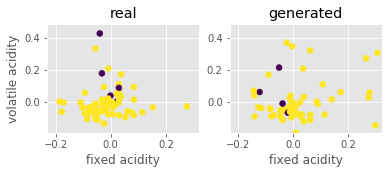

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.6988, 0.7074, 0.6661
D Real - D Gen: -0.0413


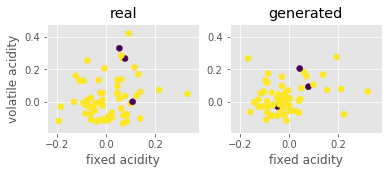

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.6877, 0.6882, 0.6801
D Real - D Gen: -0.0081


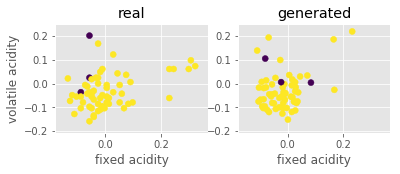

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.6053, 0.6637, 0.6661
D Real - D Gen: 0.0023


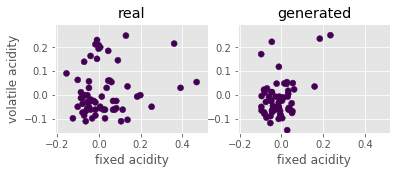

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.6371, 0.6651, 0.6999
D Real - D Gen: 0.0348


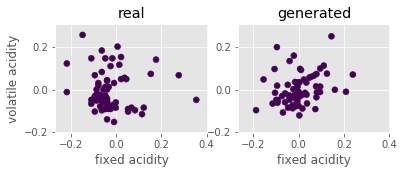

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 0.6422, 0.6716, 0.6803
D Real - D Gen: 0.0087


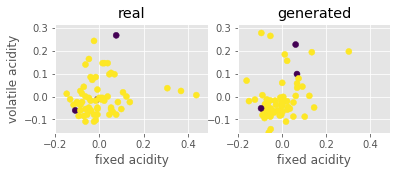

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.6384, 0.6928, 0.6773
D Real - D Gen: -0.0155


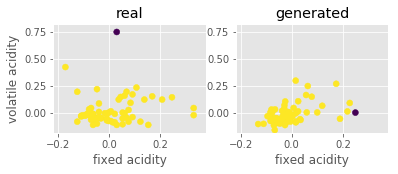

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6756, 0.6797
D Real - D Gen: 0.0041


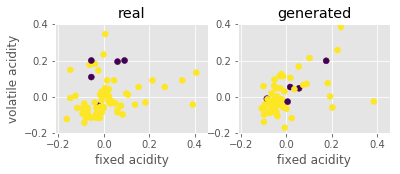

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6610, 0.6681
D Real - D Gen: 0.0072


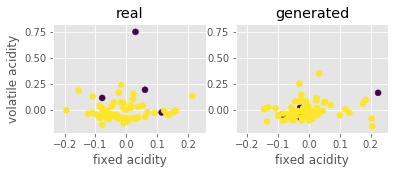

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 0.6387, 0.6823, 0.6569
D Real - D Gen: -0.0254


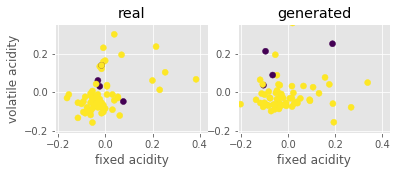

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 0.6391, 0.6612, 0.6538
D Real - D Gen: -0.0074


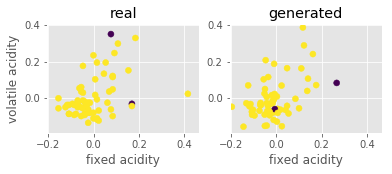

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 0.6562, 0.6733, 0.6697
D Real - D Gen: -0.0036


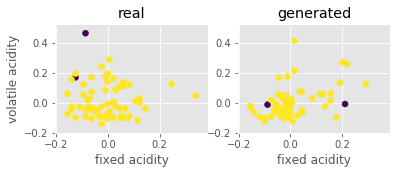

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 0.6314, 0.6776, 0.6832
D Real - D Gen: 0.0056


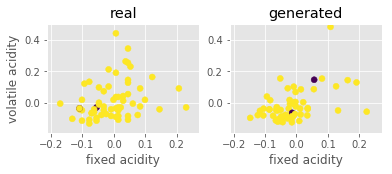

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.6359, 0.6860, 0.6457
D Real - D Gen: -0.0404


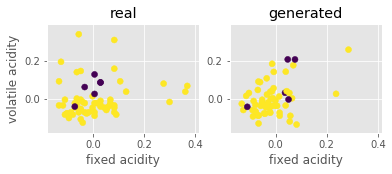

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.6446, 0.6683, 0.6833
D Real - D Gen: 0.0150


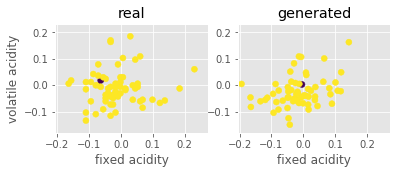

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.6552, 0.6527, 0.6595
D Real - D Gen: 0.0068


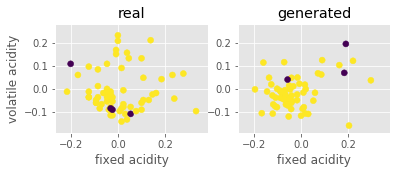

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 0.6316, 0.6683, 0.6823
D Real - D Gen: 0.0140


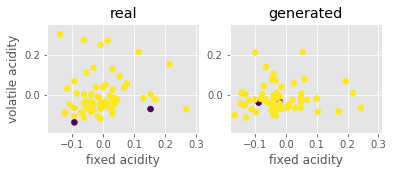

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 0.6112, 0.6783, 0.6748
D Real - D Gen: -0.0035


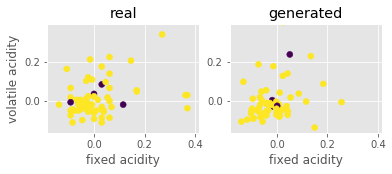

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 0.6434, 0.6456, 0.6748
D Real - D Gen: 0.0292


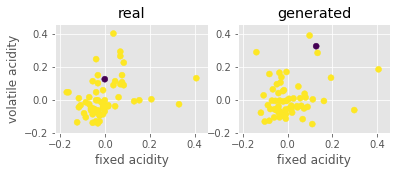

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 0.6338, 0.6477, 0.6813
D Real - D Gen: 0.0336


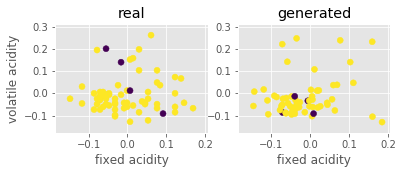

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.6406, 0.6559, 0.6987
D Real - D Gen: 0.0428


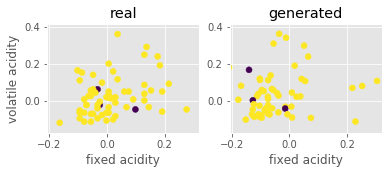

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 0.6301, 0.6653, 0.6817
D Real - D Gen: 0.0164


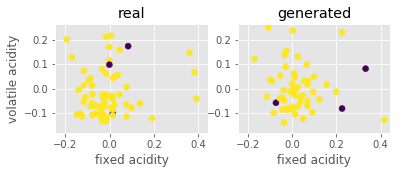

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 0.6374, 0.6734, 0.6783
D Real - D Gen: 0.0049


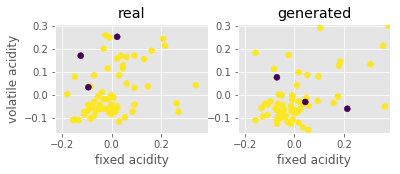

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 0.6260, 0.6807, 0.6695
D Real - D Gen: -0.0112


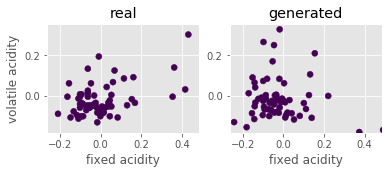

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.6107, 0.6810, 0.6563
D Real - D Gen: -0.0247


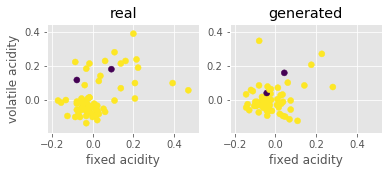

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 0.6691, 0.6958, 0.6853
D Real - D Gen: -0.0106


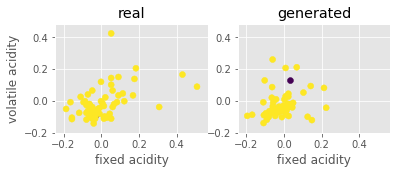

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 0.6491, 0.6695, 0.6938
D Real - D Gen: 0.0243


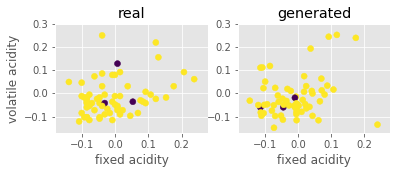

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 0.6421, 0.6477, 0.6754
D Real - D Gen: 0.0277


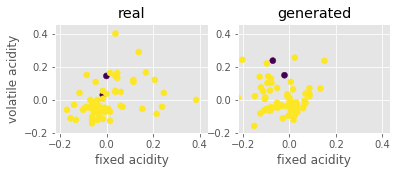

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 0.6522, 0.6680, 0.6826
D Real - D Gen: 0.0146


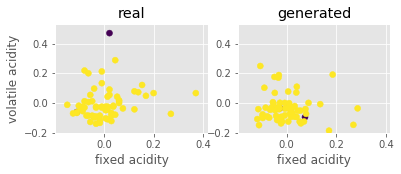

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 0.6508, 0.6803, 0.6607
D Real - D Gen: -0.0196


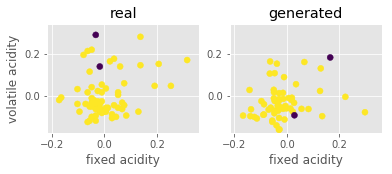

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 0.6409, 0.6612, 0.6843
D Real - D Gen: 0.0230


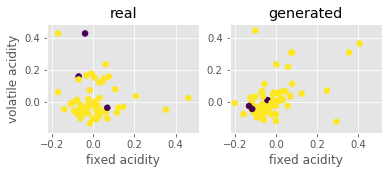

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 0.6545, 0.6519, 0.6624
D Real - D Gen: 0.0105


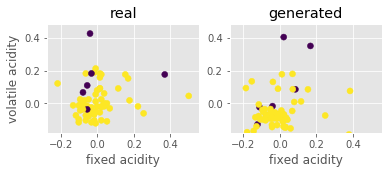

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6818, 0.6815
D Real - D Gen: -0.0003


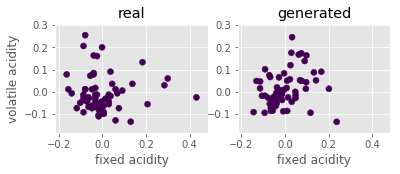

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 0.6231, 0.6602, 0.6931
D Real - D Gen: 0.0329


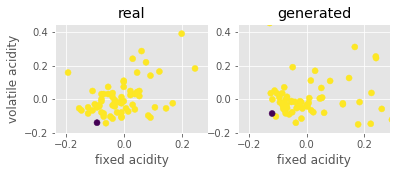

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 0.6372, 0.6891, 0.6730
D Real - D Gen: -0.0161


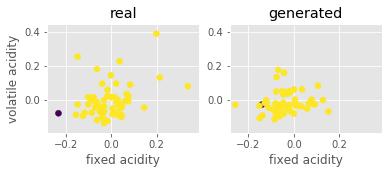

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 0.6422, 0.6847, 0.6655
D Real - D Gen: -0.0192


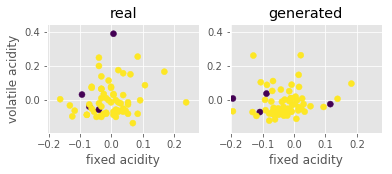

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 0.6761, 0.6585, 0.6751
D Real - D Gen: 0.0166


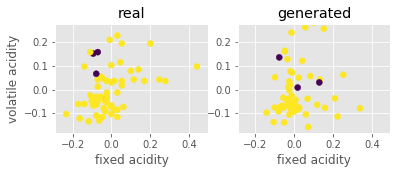

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 0.6397, 0.6756, 0.6598
D Real - D Gen: -0.0158


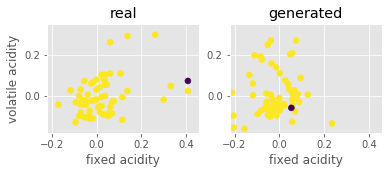

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 0.6382, 0.6683, 0.6441
D Real - D Gen: -0.0242


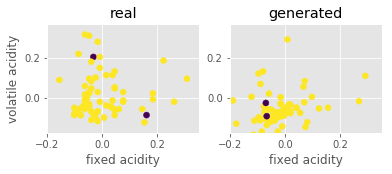

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 0.6518, 0.6728, 0.6752
D Real - D Gen: 0.0024


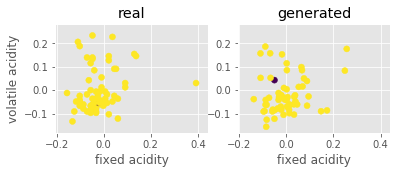

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 0.6374, 0.6573, 0.6469
D Real - D Gen: -0.0104


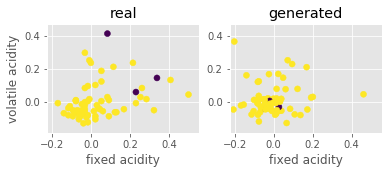

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 0.6404, 0.6832, 0.6741
D Real - D Gen: -0.0091


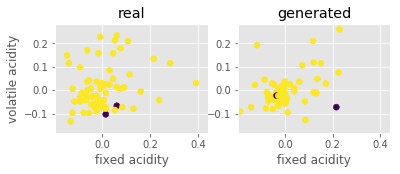

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 0.6601, 0.6748, 0.6765
D Real - D Gen: 0.0017


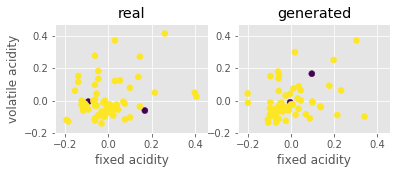

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 0.6389, 0.6559, 0.6707
D Real - D Gen: 0.0148


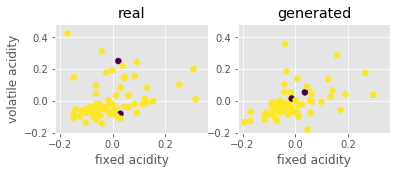

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 0.6619, 0.6881, 0.6542
D Real - D Gen: -0.0339


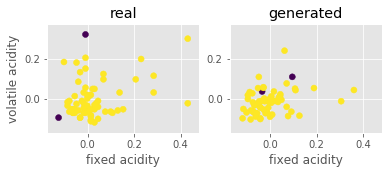

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 0.6333, 0.6796, 0.6468
D Real - D Gen: -0.0328


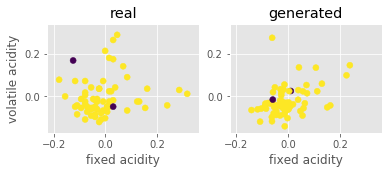

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.6865, 0.6596
D Real - D Gen: -0.0269


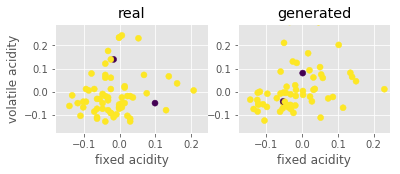

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 0.6693, 0.6845, 0.6808
D Real - D Gen: -0.0037


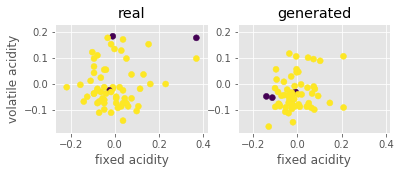

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 0.6300, 0.6661, 0.6814
D Real - D Gen: 0.0153


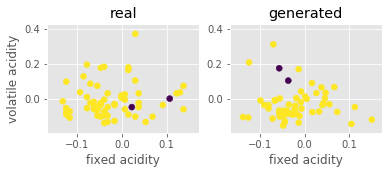

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 0.6706, 0.6882, 0.6633
D Real - D Gen: -0.0248


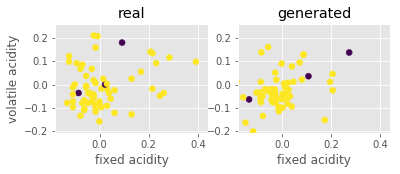

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 0.6636, 0.6382, 0.6526
D Real - D Gen: 0.0143


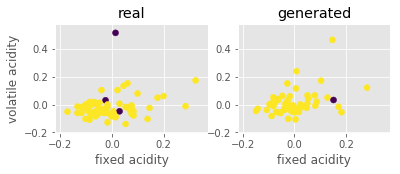

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 0.6735, 0.6605, 0.6333
D Real - D Gen: -0.0272


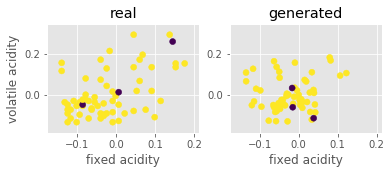

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 0.6577, 0.6695, 0.6737
D Real - D Gen: 0.0042


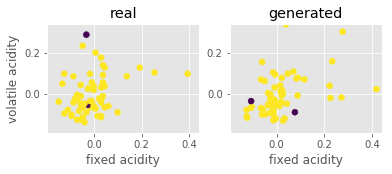

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 0.6779, 0.6914, 0.6617
D Real - D Gen: -0.0298


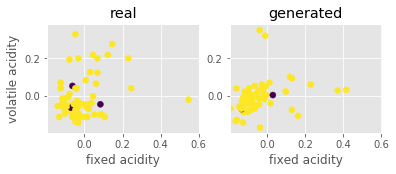

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 0.6846, 0.6897, 0.6712
D Real - D Gen: -0.0184


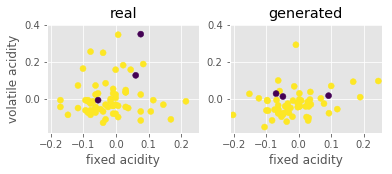

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 0.6903, 0.6647, 0.6945
D Real - D Gen: 0.0298


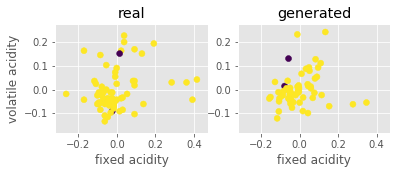

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 0.6996, 0.6824, 0.6841
D Real - D Gen: 0.0017


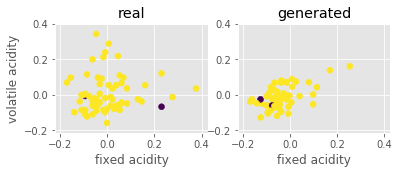

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 0.6900, 0.6783, 0.6733
D Real - D Gen: -0.0051


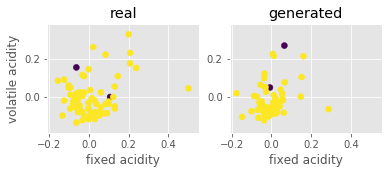

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 0.7059, 0.6815, 0.6638
D Real - D Gen: -0.0177


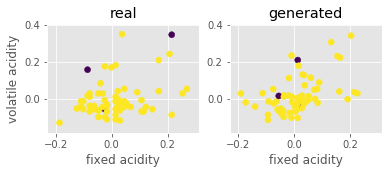

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 0.6653, 0.6592, 0.6901
D Real - D Gen: 0.0308


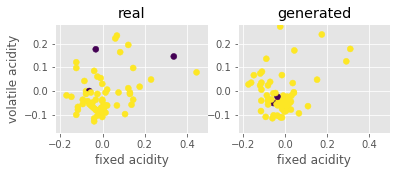

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 0.6698, 0.6643, 0.6577
D Real - D Gen: -0.0067


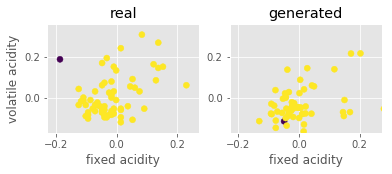

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 0.6721, 0.6791, 0.6696
D Real - D Gen: -0.0095


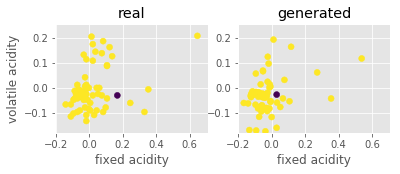

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 0.6757, 0.6620, 0.6459
D Real - D Gen: -0.0162


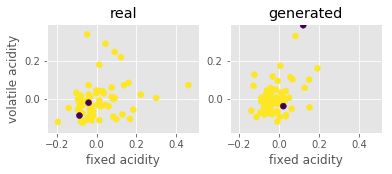

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 0.7075, 0.6673, 0.6986
D Real - D Gen: 0.0314


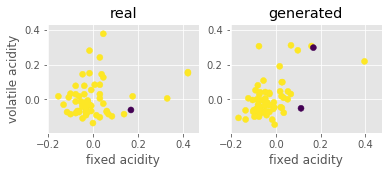

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 0.6828, 0.6551, 0.6648
D Real - D Gen: 0.0097


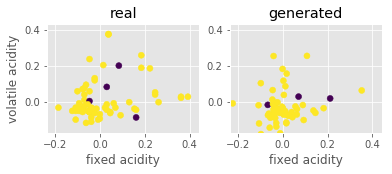

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 0.7003, 0.6772, 0.6545
D Real - D Gen: -0.0227


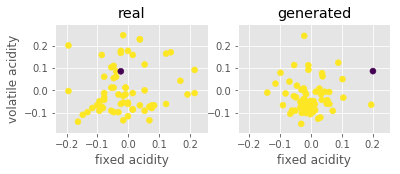

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 0.6995, 0.6684, 0.6838
D Real - D Gen: 0.0154


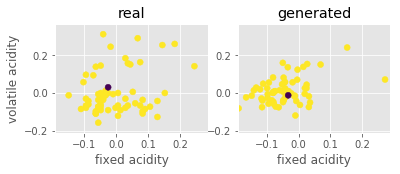

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 0.6871, 0.6838, 0.6547
D Real - D Gen: -0.0291


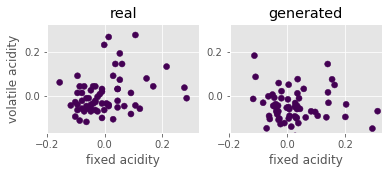

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 0.7504, 0.6724, 0.6715
D Real - D Gen: -0.0009


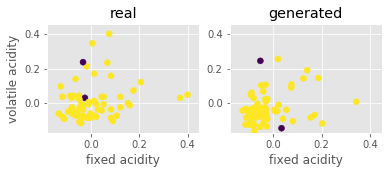

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 0.7070, 0.6691, 0.6814
D Real - D Gen: 0.0122


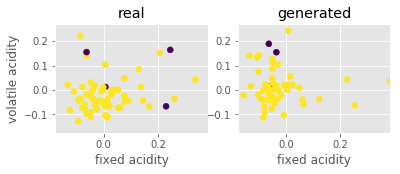

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 0.5895, 0.6522, 0.6523
D Real - D Gen: 0.0001


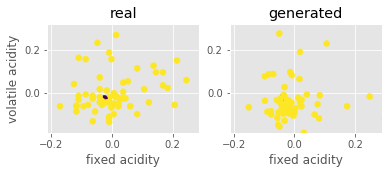

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 0.6004, 0.6620, 0.6641
D Real - D Gen: 0.0020


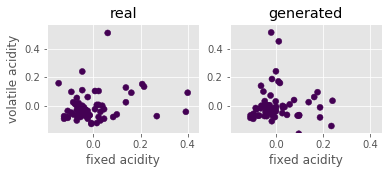

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 0.6091, 0.6575, 0.6173
D Real - D Gen: -0.0402


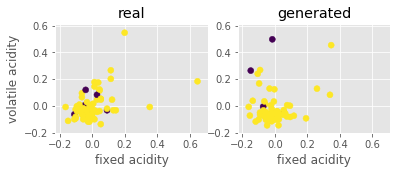

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 0.6048, 0.6499, 0.6338
D Real - D Gen: -0.0160


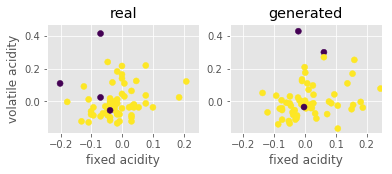

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 0.6269, 0.6507, 0.6462
D Real - D Gen: -0.0044


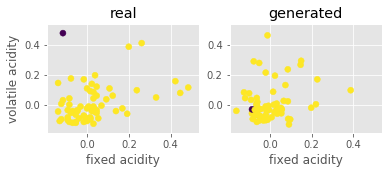

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 0.5835, 0.6339, 0.6349
D Real - D Gen: 0.0010


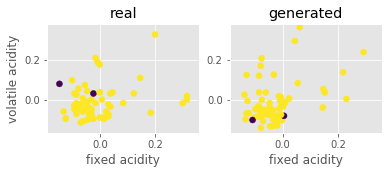

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 0.5856, 0.6674, 0.6665
D Real - D Gen: -0.0010


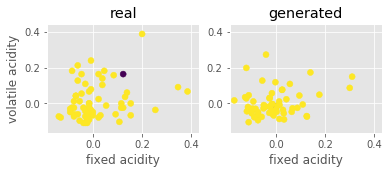

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 0.6245, 0.6554, 0.6630
D Real - D Gen: 0.0075


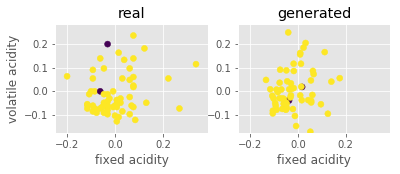

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 0.5954, 0.6728, 0.6597
D Real - D Gen: -0.0131


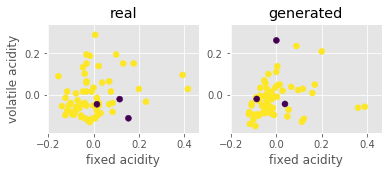

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 0.6361, 0.6585, 0.6655
D Real - D Gen: 0.0070


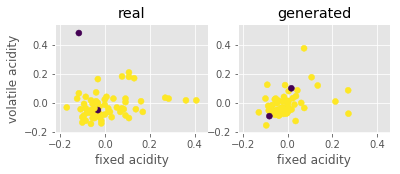

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 0.5867, 0.6694, 0.6612
D Real - D Gen: -0.0082


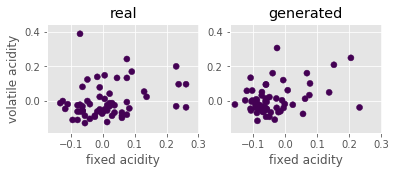

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 0.6011, 0.6666, 0.6304
D Real - D Gen: -0.0362


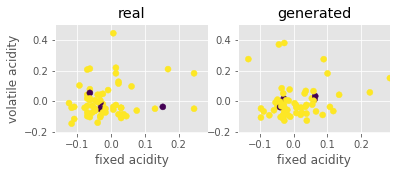

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 0.5718, 0.6680, 0.6630
D Real - D Gen: -0.0050


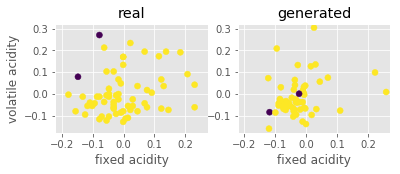

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 0.5936, 0.6841, 0.6555
D Real - D Gen: -0.0286


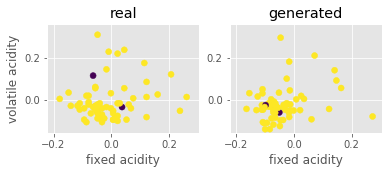

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 0.5703, 0.6450, 0.6628
D Real - D Gen: 0.0177


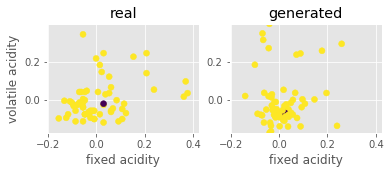

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 0.5996, 0.6710, 0.6743
D Real - D Gen: 0.0033


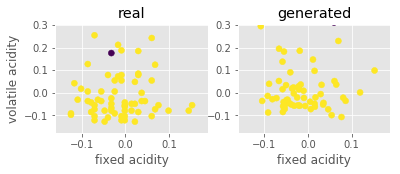

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 0.6129, 0.6788, 0.6893
D Real - D Gen: 0.0105


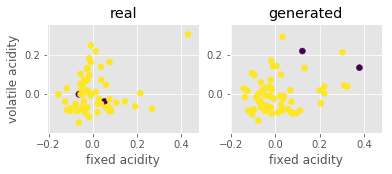

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 0.6192, 0.6664, 0.6781
D Real - D Gen: 0.0118


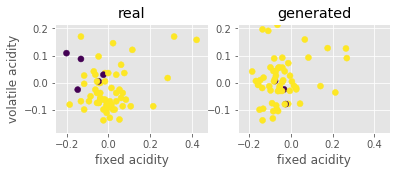

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 0.6223, 0.6612, 0.6421
D Real - D Gen: -0.0191


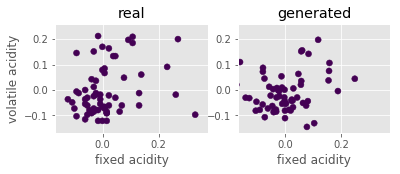

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 0.6374, 0.6528, 0.6469
D Real - D Gen: -0.0060


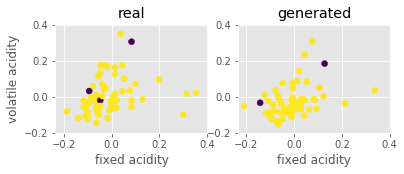

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 0.6176, 0.6807, 0.6413
D Real - D Gen: -0.0394


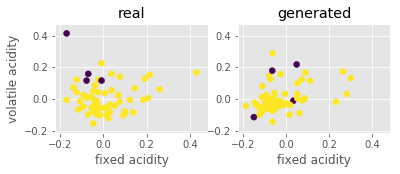

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 0.5898, 0.6666, 0.6656
D Real - D Gen: -0.0010


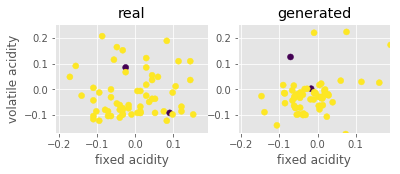

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 0.6712, 0.6696, 0.6828
D Real - D Gen: 0.0132


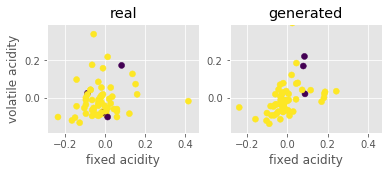

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 0.6213, 0.6431, 0.6210
D Real - D Gen: -0.0222


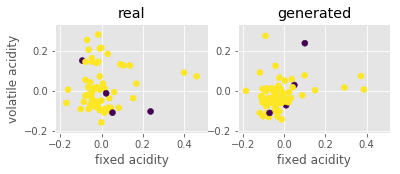

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 0.6203, 0.6639, 0.6170
D Real - D Gen: -0.0469


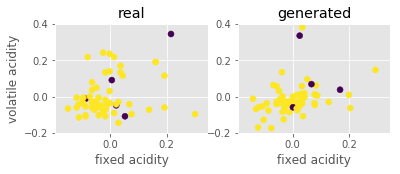

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 0.6430, 0.6674, 0.6368
D Real - D Gen: -0.0306


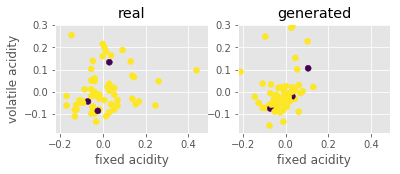

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 0.6344, 0.6733, 0.7046
D Real - D Gen: 0.0313


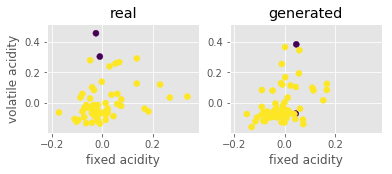

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 0.6812, 0.6589, 0.6741
D Real - D Gen: 0.0152


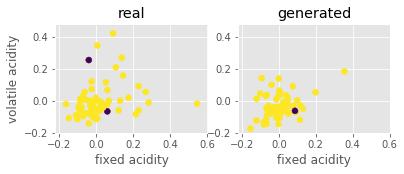

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 0.6066, 0.6821, 0.6943
D Real - D Gen: 0.0121


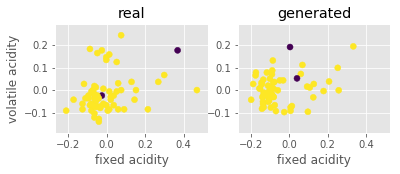

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 0.6163, 0.6444, 0.6687
D Real - D Gen: 0.0243


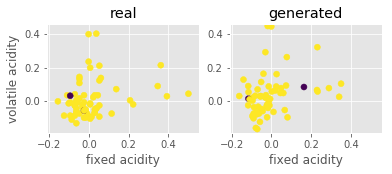

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 0.6179, 0.6636, 0.5937
D Real - D Gen: -0.0699


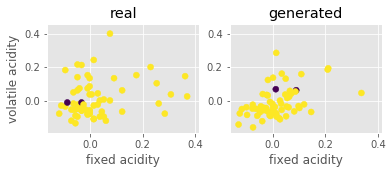

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 0.5892, 0.6797, 0.6800
D Real - D Gen: 0.0003


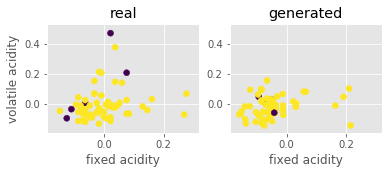

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 0.6460, 0.6382, 0.6777
D Real - D Gen: 0.0395


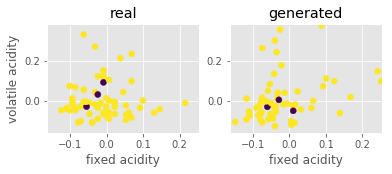

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 0.6157, 0.6769, 0.6715
D Real - D Gen: -0.0054


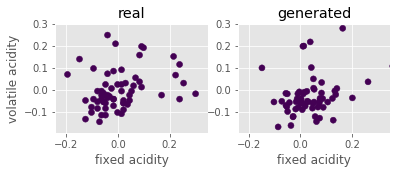

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 0.6265, 0.6667, 0.6622
D Real - D Gen: -0.0045


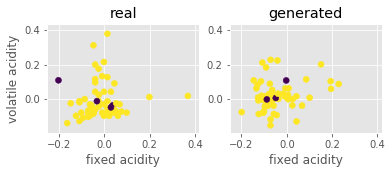

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 0.6239, 0.6772, 0.6757
D Real - D Gen: -0.0015


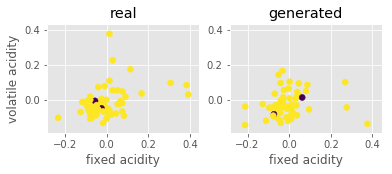

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 0.6437, 0.6587, 0.6656
D Real - D Gen: 0.0070


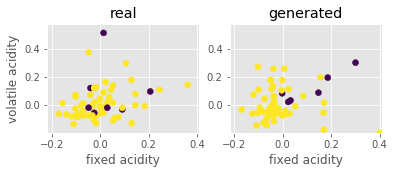

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 0.6078, 0.6788, 0.6820
D Real - D Gen: 0.0032


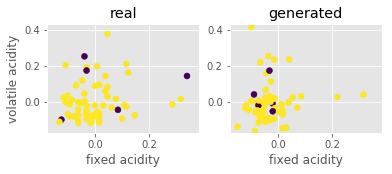

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 0.6141, 0.6681, 0.6512
D Real - D Gen: -0.0170


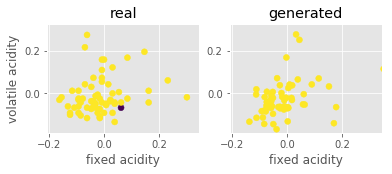

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 0.6150, 0.6739, 0.6554
D Real - D Gen: -0.0184


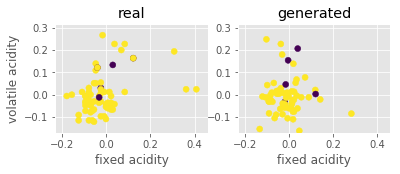

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 0.6361, 0.6551, 0.6646
D Real - D Gen: 0.0095


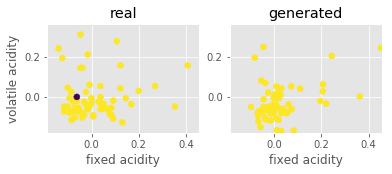

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 0.6440, 0.6704, 0.6601
D Real - D Gen: -0.0103


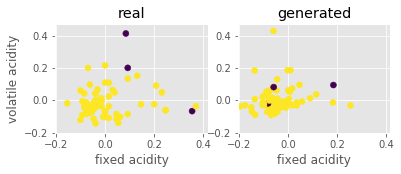

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 0.6421, 0.6838, 0.6653
D Real - D Gen: -0.0185


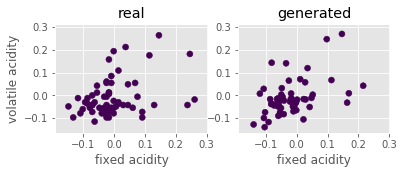

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 0.6516, 0.6426, 0.6229
D Real - D Gen: -0.0197


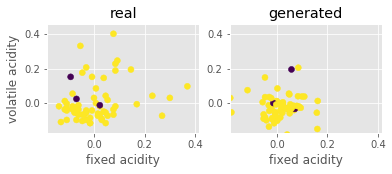

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 0.6596, 0.6829, 0.6668
D Real - D Gen: -0.0161


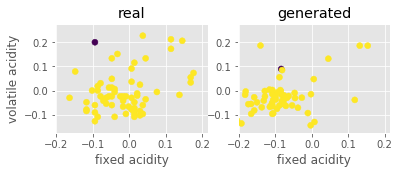

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 0.6784, 0.6589, 0.6816
D Real - D Gen: 0.0227


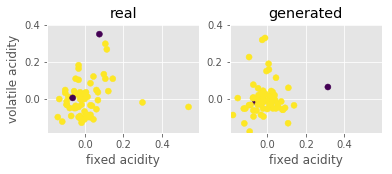

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 0.6525, 0.6591, 0.6612
D Real - D Gen: 0.0021


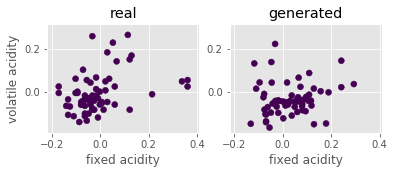

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.6796, 0.6801
D Real - D Gen: 0.0005


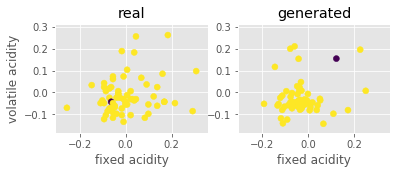

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 0.6393, 0.6716, 0.6759
D Real - D Gen: 0.0043


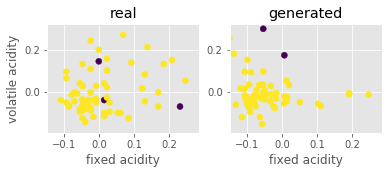

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 0.7096, 0.7371, 0.6968
D Real - D Gen: -0.0403


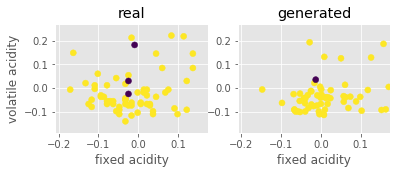

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 0.6615, 0.6556, 0.6657
D Real - D Gen: 0.0101


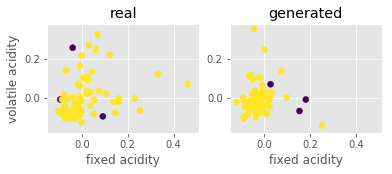

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 0.6923, 0.6702, 0.6792
D Real - D Gen: 0.0090


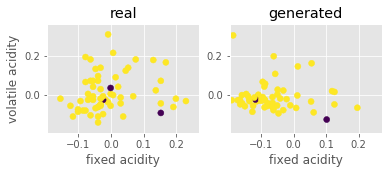

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 0.7099, 0.6754, 0.6837
D Real - D Gen: 0.0083


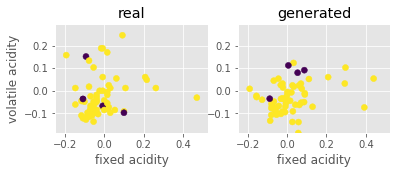

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 0.6692, 0.6670, 0.6743
D Real - D Gen: 0.0073


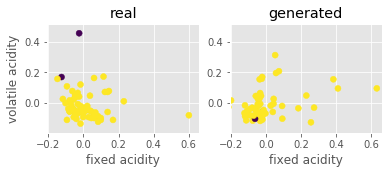

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 0.6971, 0.6317, 0.6808
D Real - D Gen: 0.0490


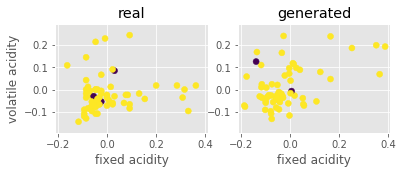

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 0.6812, 0.6565, 0.6352
D Real - D Gen: -0.0213


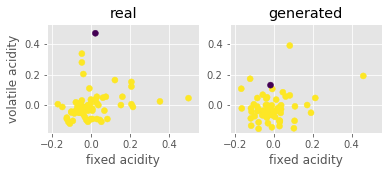

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 0.6606, 0.6677, 0.6768
D Real - D Gen: 0.0091


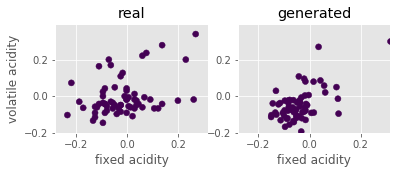

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 0.6467, 0.6355, 0.6697
D Real - D Gen: 0.0342


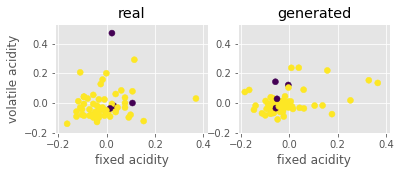

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 0.7022, 0.7196, 0.6309
D Real - D Gen: -0.0887


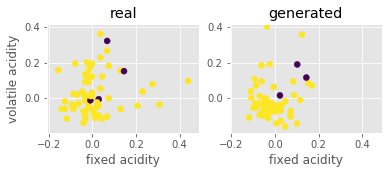

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6657, 0.6170
D Real - D Gen: -0.0486


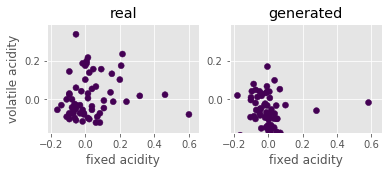

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 0.6766, 0.6322, 0.6519
D Real - D Gen: 0.0198


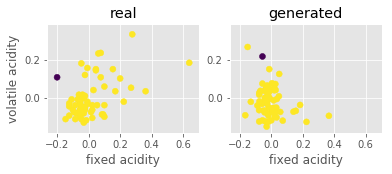

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 0.6661, 0.6787, 0.6612
D Real - D Gen: -0.0175


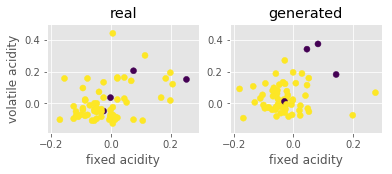

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 0.7229, 0.6361, 0.6631
D Real - D Gen: 0.0269


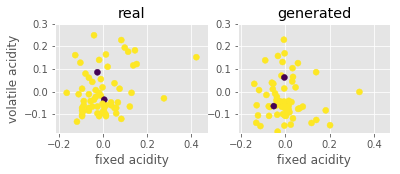

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 0.6921, 0.6903, 0.6865
D Real - D Gen: -0.0038


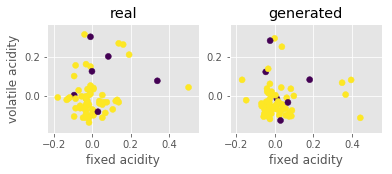

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 0.7174, 0.6688, 0.6497
D Real - D Gen: -0.0191


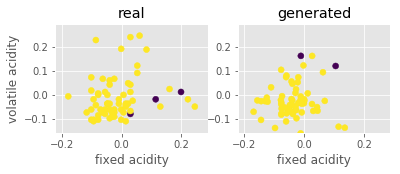

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 0.7624, 0.7005, 0.6416
D Real - D Gen: -0.0589


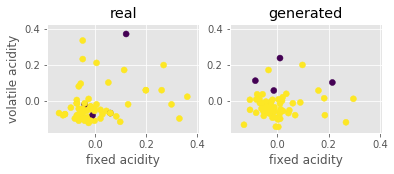

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 0.7462, 0.6745, 0.6766
D Real - D Gen: 0.0021


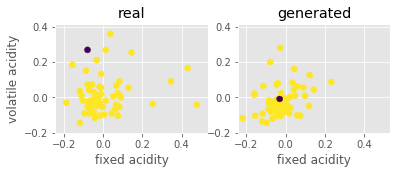

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 0.6406, 0.6444, 0.6562
D Real - D Gen: 0.0118


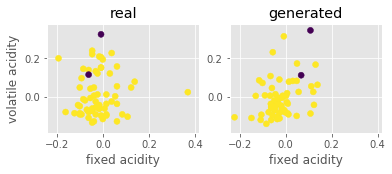

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 0.6269, 0.6724, 0.6813
D Real - D Gen: 0.0089


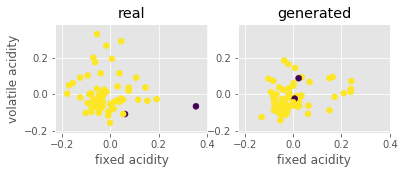

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 0.5891, 0.6587, 0.6700
D Real - D Gen: 0.0112


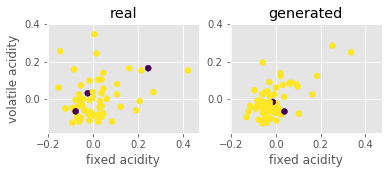

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 0.5964, 0.6291, 0.6482
D Real - D Gen: 0.0190


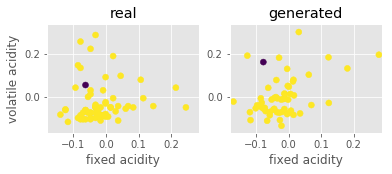

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 0.6097, 0.6798, 0.6422
D Real - D Gen: -0.0376


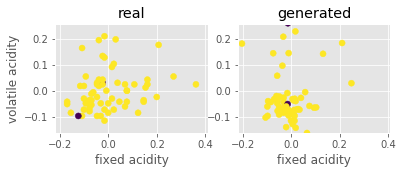

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 0.6045, 0.6611, 0.6394
D Real - D Gen: -0.0217


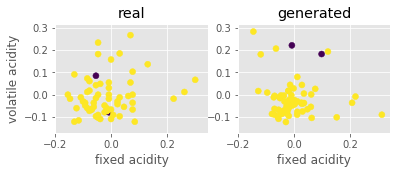

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 0.6257, 0.6339, 0.6975
D Real - D Gen: 0.0635


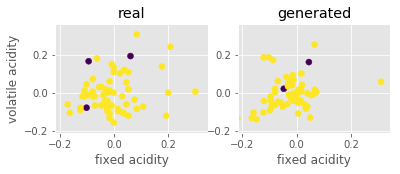

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 0.6527, 0.6641, 0.6488
D Real - D Gen: -0.0153


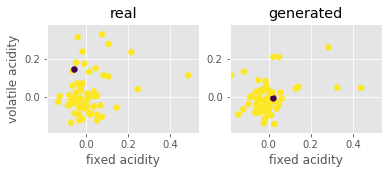

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 0.6329, 0.6701, 0.6477
D Real - D Gen: -0.0224


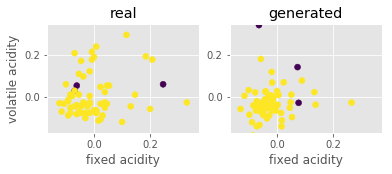

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 0.6087, 0.6520, 0.6636
D Real - D Gen: 0.0116


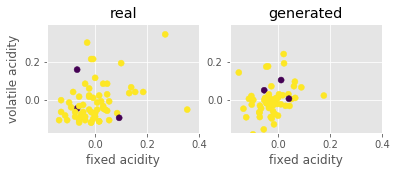

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 0.6031, 0.6457, 0.6348
D Real - D Gen: -0.0109


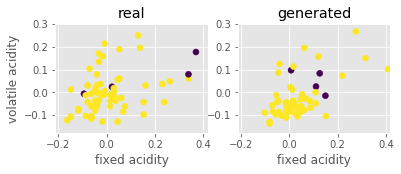

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 0.5649, 0.6504, 0.6588
D Real - D Gen: 0.0084


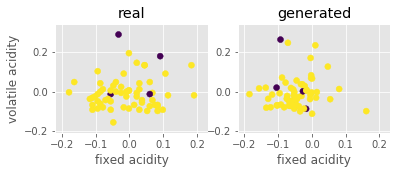

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 0.6847, 0.6378, 0.6733
D Real - D Gen: 0.0355


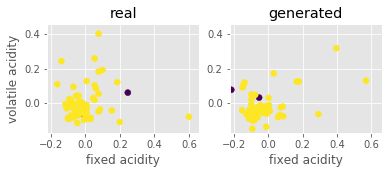

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 0.6280, 0.6620, 0.6615
D Real - D Gen: -0.0005


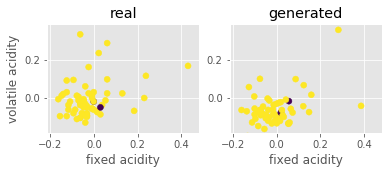

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 0.6262, 0.6396, 0.6487
D Real - D Gen: 0.0091


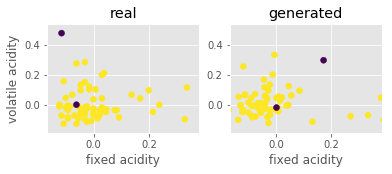

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 0.5885, 0.6426, 0.6311
D Real - D Gen: -0.0115


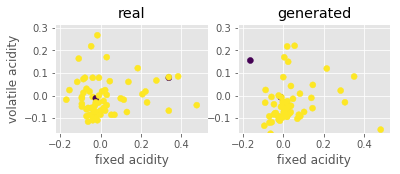

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 0.5972, 0.6715, 0.6454
D Real - D Gen: -0.0261


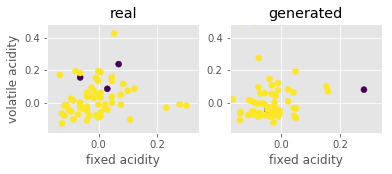

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 0.6060, 0.6605, 0.6562
D Real - D Gen: -0.0043


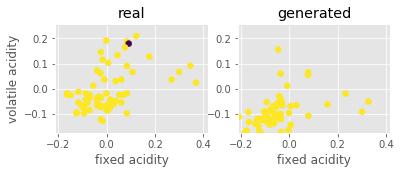

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 0.6125, 0.6573, 0.6824
D Real - D Gen: 0.0251


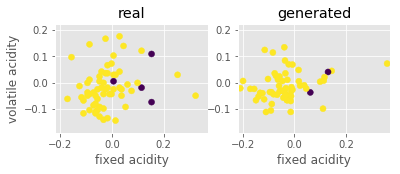

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 0.6102, 0.6229, 0.6576
D Real - D Gen: 0.0347


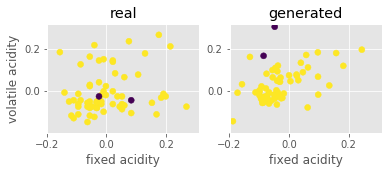

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 0.5851, 0.6794, 0.6586
D Real - D Gen: -0.0208


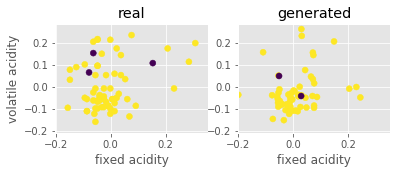

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 0.5998, 0.6582, 0.6756
D Real - D Gen: 0.0175


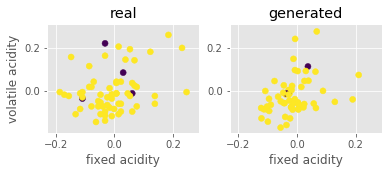

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 0.5786, 0.6531, 0.6683
D Real - D Gen: 0.0151


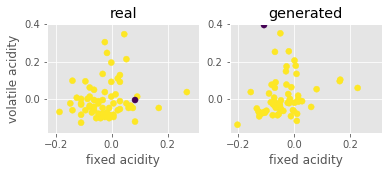

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 0.6111, 0.6521, 0.6609
D Real - D Gen: 0.0087


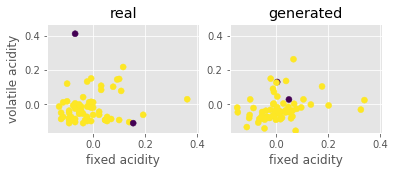

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 0.5915, 0.6822, 0.6493
D Real - D Gen: -0.0330


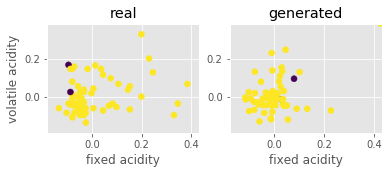

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 0.6214, 0.6910, 0.6725
D Real - D Gen: -0.0184


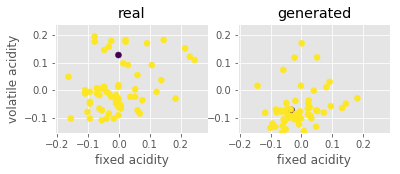

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6481, 0.6044
D Real - D Gen: -0.0437


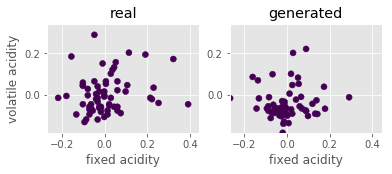

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 0.6571, 0.6741, 0.6516
D Real - D Gen: -0.0225


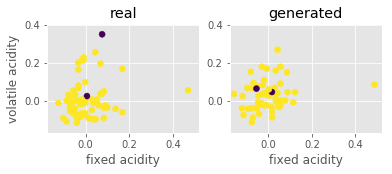

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 0.6123, 0.6777, 0.6553
D Real - D Gen: -0.0225


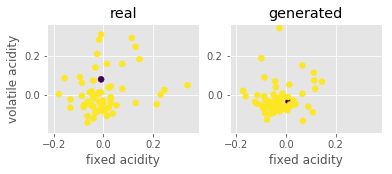

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 0.6749, 0.6490, 0.5884
D Real - D Gen: -0.0607


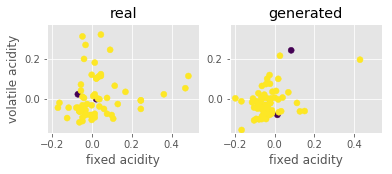

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 0.6217, 0.6604, 0.6410
D Real - D Gen: -0.0194


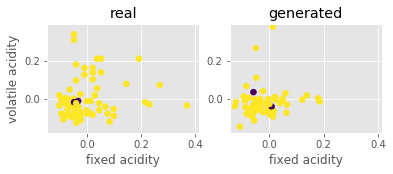

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 0.6546, 0.6709, 0.6560
D Real - D Gen: -0.0150


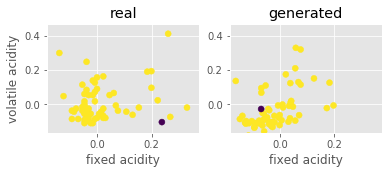

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 0.6193, 0.6837, 0.6577
D Real - D Gen: -0.0260


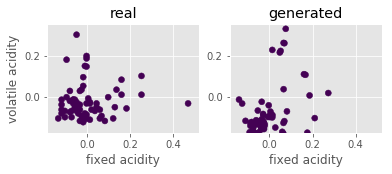

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 0.6460, 0.6712, 0.6822
D Real - D Gen: 0.0111


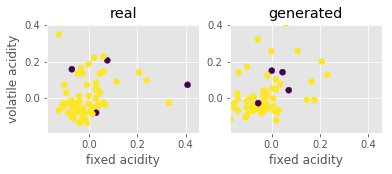

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 0.6525, 0.6611, 0.6324
D Real - D Gen: -0.0287


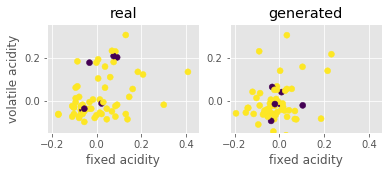

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 0.6193, 0.6731, 0.6602
D Real - D Gen: -0.0129


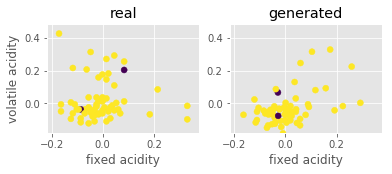

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 0.6433, 0.6782, 0.6694
D Real - D Gen: -0.0088


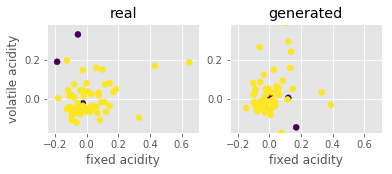

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 0.6528, 0.6580, 0.6764
D Real - D Gen: 0.0185


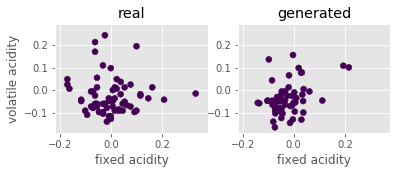

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 0.6508, 0.6420, 0.6202
D Real - D Gen: -0.0219


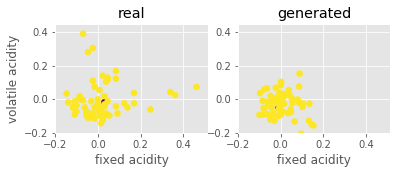

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 0.6779, 0.6325, 0.6185
D Real - D Gen: -0.0140


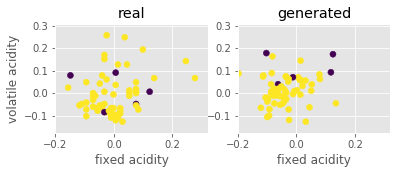

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 0.6654, 0.7061, 0.6315
D Real - D Gen: -0.0746


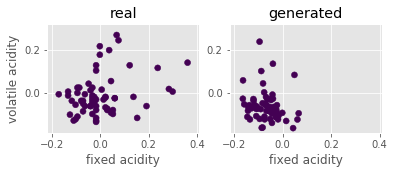

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 0.6274, 0.6844, 0.6626
D Real - D Gen: -0.0218


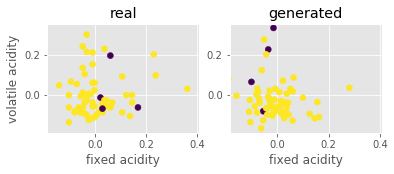

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 0.6658, 0.6450, 0.6714
D Real - D Gen: 0.0263


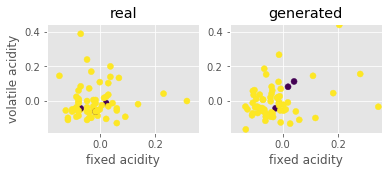

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 0.6877, 0.6828, 0.6673
D Real - D Gen: -0.0155


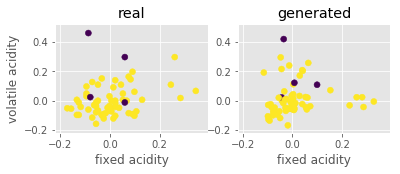

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 0.6569, 0.6631, 0.6883
D Real - D Gen: 0.0253


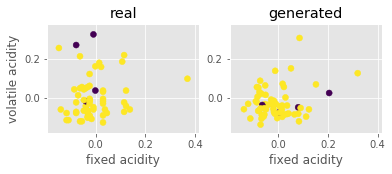

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 0.6383, 0.6595, 0.6464
D Real - D Gen: -0.0131


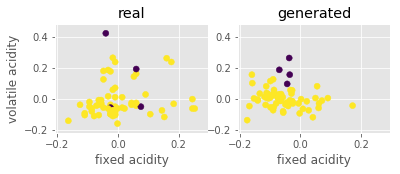

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 0.6626, 0.6926, 0.6764
D Real - D Gen: -0.0163


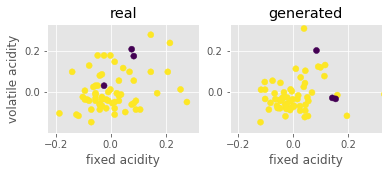

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 0.6650, 0.6635, 0.6604
D Real - D Gen: -0.0031


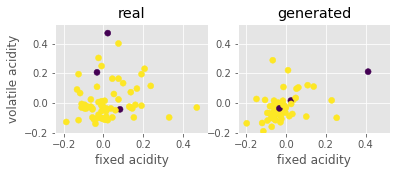

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 0.6468, 0.6398, 0.7114
D Real - D Gen: 0.0716


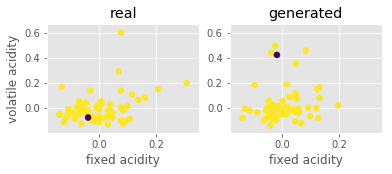

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 0.6421, 0.6678, 0.6448
D Real - D Gen: -0.0229


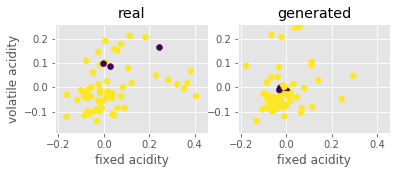

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 0.6769, 0.6702, 0.6668
D Real - D Gen: -0.0035


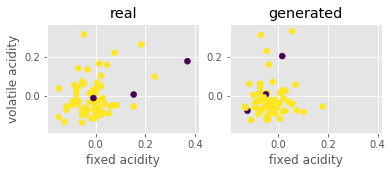

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 0.6612, 0.6701, 0.6739
D Real - D Gen: 0.0038


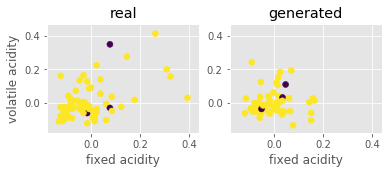

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 0.6099, 0.6639, 0.6640
D Real - D Gen: 0.0001


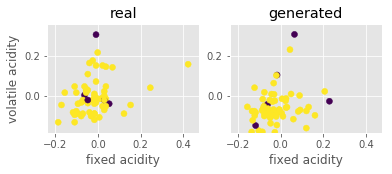

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 0.6682, 0.6568, 0.6454
D Real - D Gen: -0.0114


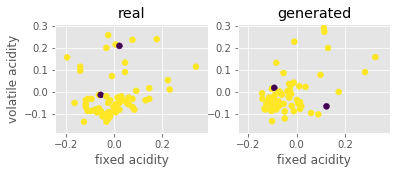

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 0.6639, 0.6764, 0.6101
D Real - D Gen: -0.0663


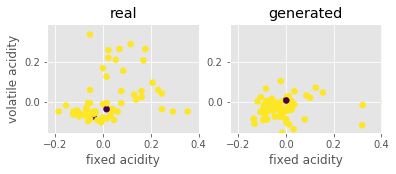

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 0.6478, 0.6778, 0.6654
D Real - D Gen: -0.0124


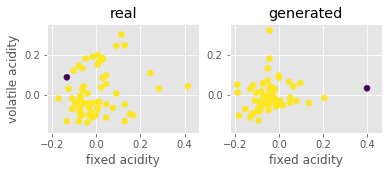

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 0.6742, 0.6517, 0.6979
D Real - D Gen: 0.0462


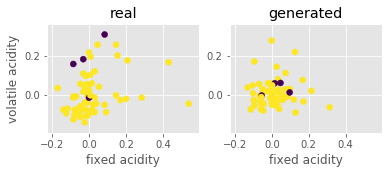

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 0.6553, 0.6536, 0.6418
D Real - D Gen: -0.0117


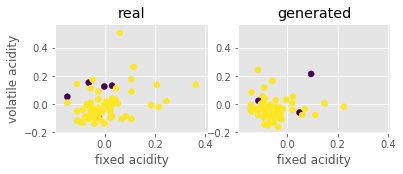

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 0.6725, 0.7336, 0.6954
D Real - D Gen: -0.0382


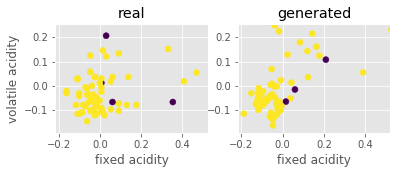

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 0.7030, 0.6901, 0.6611
D Real - D Gen: -0.0290


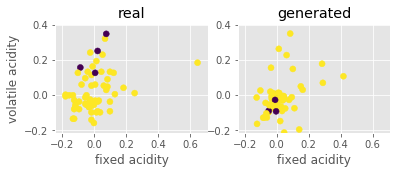

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 0.7119, 0.6548, 0.6811
D Real - D Gen: 0.0264


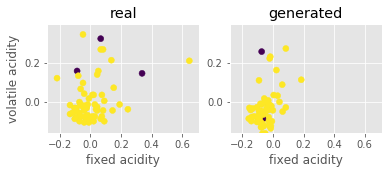

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 0.6632, 0.6605, 0.6570
D Real - D Gen: -0.0035


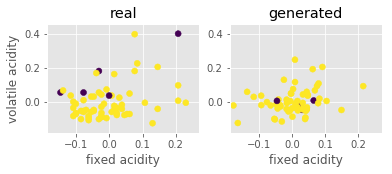

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 0.6739, 0.6889, 0.6255
D Real - D Gen: -0.0634


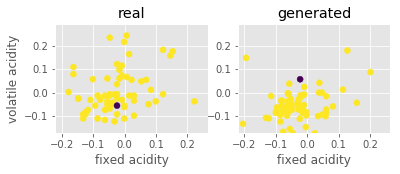

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 0.7250, 0.6802, 0.6095
D Real - D Gen: -0.0707


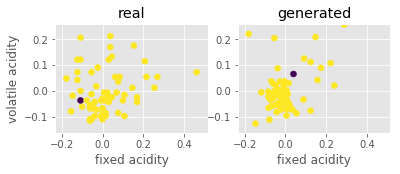

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 0.7348, 0.7015, 0.6145
D Real - D Gen: -0.0870


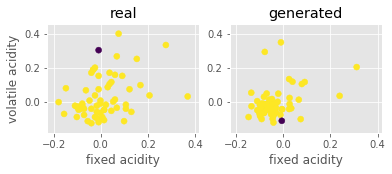

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 0.7453, 0.6715, 0.6459
D Real - D Gen: -0.0256


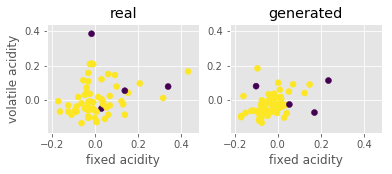

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 0.7643, 0.6729, 0.6491
D Real - D Gen: -0.0238


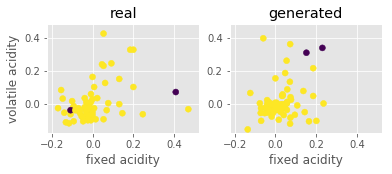

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 0.6252, 0.6185, 0.6697
D Real - D Gen: 0.0512


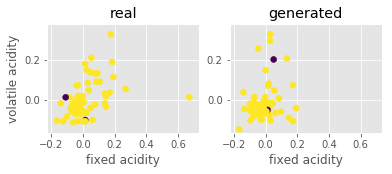

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 0.6569, 0.6471, 0.7030
D Real - D Gen: 0.0559


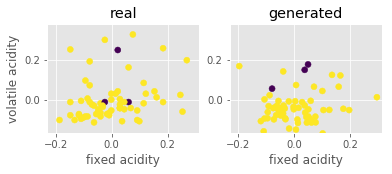

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 0.5778, 0.6774, 0.6454
D Real - D Gen: -0.0320


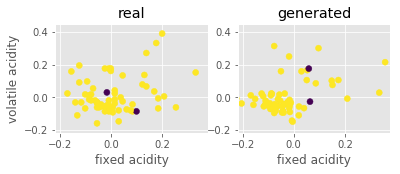

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 0.6384, 0.6349, 0.6274
D Real - D Gen: -0.0075


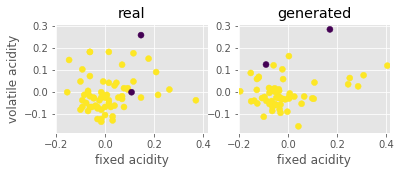

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 0.5665, 0.6483, 0.6218
D Real - D Gen: -0.0265


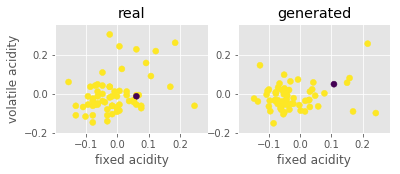

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6520, 0.6724
D Real - D Gen: 0.0204


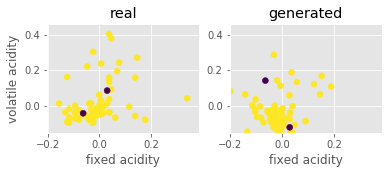

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 0.6317, 0.6899, 0.6650
D Real - D Gen: -0.0249


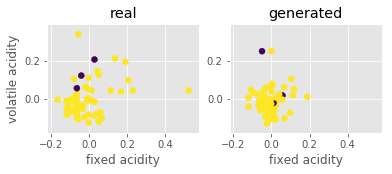

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 0.6164, 0.6271, 0.7244
D Real - D Gen: 0.0972


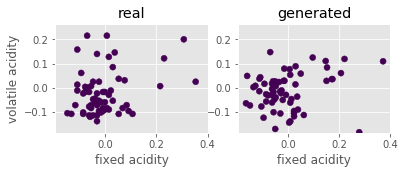

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 0.6122, 0.6317, 0.6401
D Real - D Gen: 0.0084


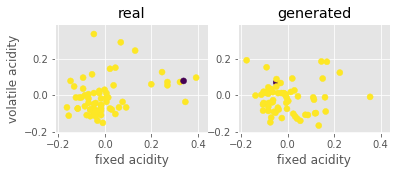

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 0.6185, 0.6402, 0.6591
D Real - D Gen: 0.0190


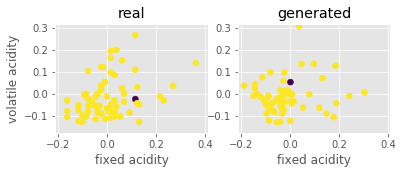

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 0.6093, 0.6885, 0.6578
D Real - D Gen: -0.0307


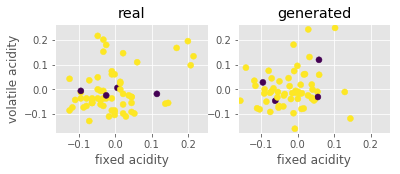

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 0.6169, 0.6747, 0.6532
D Real - D Gen: -0.0214


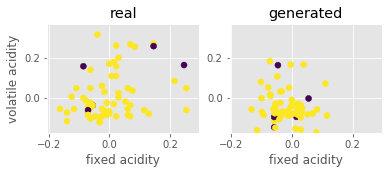

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 0.6340, 0.6538, 0.6361
D Real - D Gen: -0.0177


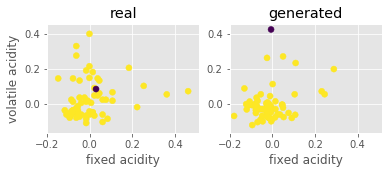

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 0.6119, 0.6469, 0.6860
D Real - D Gen: 0.0392


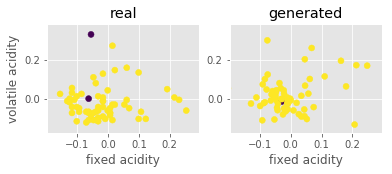

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.6501, 0.6561
D Real - D Gen: 0.0060


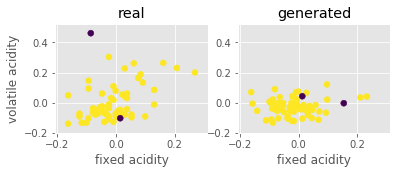

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 0.6489, 0.6363, 0.6662
D Real - D Gen: 0.0300


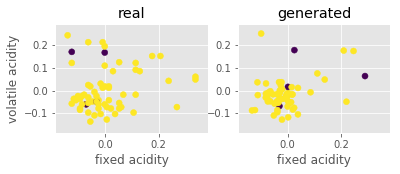

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 0.6486, 0.6651, 0.6767
D Real - D Gen: 0.0116


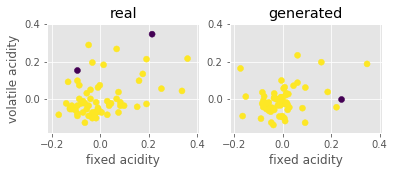

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 0.5829, 0.6226, 0.6523
D Real - D Gen: 0.0297


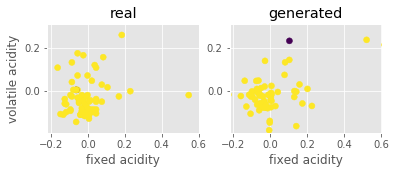

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 0.6190, 0.6483, 0.6429
D Real - D Gen: -0.0054


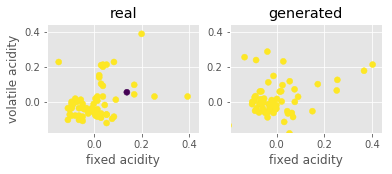

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 0.6353, 0.6694, 0.6641
D Real - D Gen: -0.0053


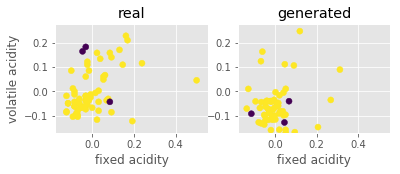

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 0.6630, 0.6459, 0.6654
D Real - D Gen: 0.0195


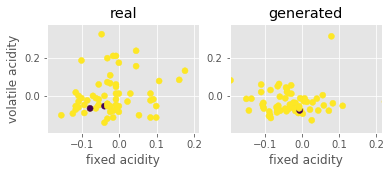

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 0.6736, 0.6247, 0.6215
D Real - D Gen: -0.0032


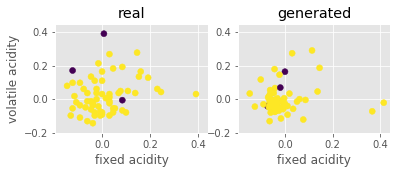

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 0.6448, 0.6213, 0.6503
D Real - D Gen: 0.0290


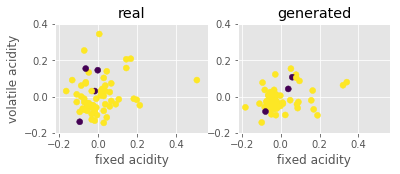

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 0.6315, 0.6604, 0.6158
D Real - D Gen: -0.0446


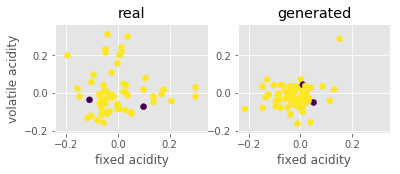

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 0.6795, 0.6410, 0.6691
D Real - D Gen: 0.0280


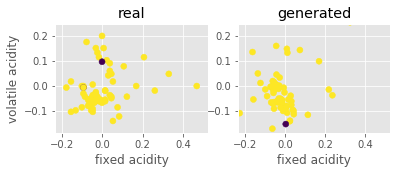

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 0.6778, 0.6590, 0.7212
D Real - D Gen: 0.0622


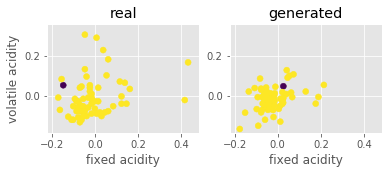

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 0.6645, 0.6214, 0.6734
D Real - D Gen: 0.0520


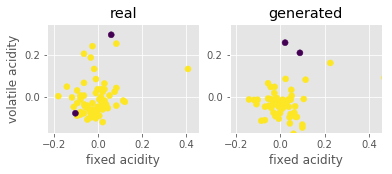

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 0.6468, 0.6501, 0.6128
D Real - D Gen: -0.0372


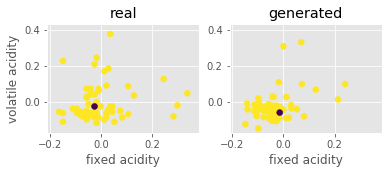

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 0.6696, 0.6249, 0.6640
D Real - D Gen: 0.0392


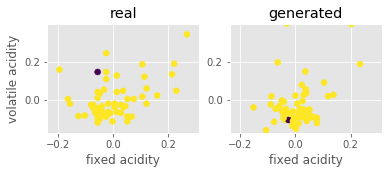

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 0.6637, 0.6591, 0.6073
D Real - D Gen: -0.0518


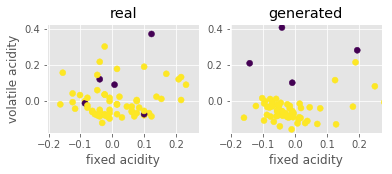

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 0.6715, 0.6508, 0.5953
D Real - D Gen: -0.0555


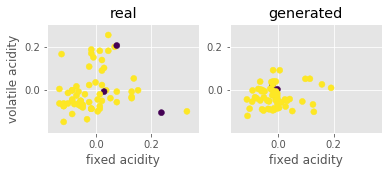

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 0.6920, 0.6190, 0.6831
D Real - D Gen: 0.0641


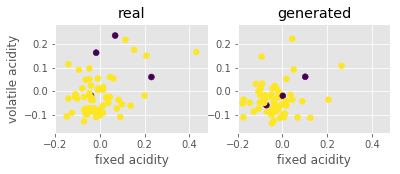

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 0.6486, 0.6309, 0.6848
D Real - D Gen: 0.0539


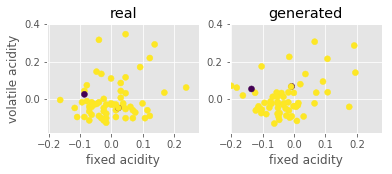

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 0.6631, 0.6502, 0.6430
D Real - D Gen: -0.0071


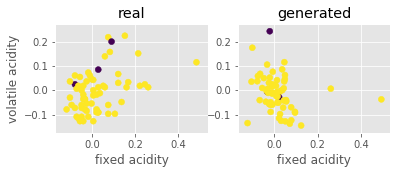

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 0.6605, 0.6291, 0.6886
D Real - D Gen: 0.0594


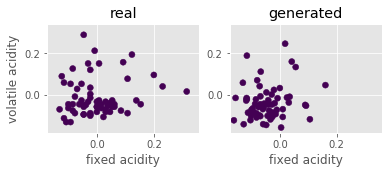

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 0.6661, 0.6471, 0.6439
D Real - D Gen: -0.0032


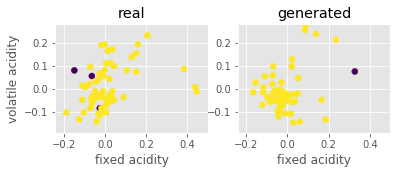

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 0.6491, 0.6648, 0.7071
D Real - D Gen: 0.0423


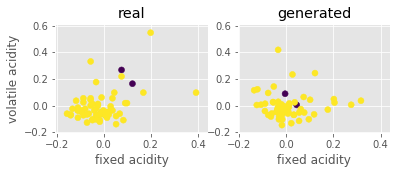

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6516, 0.6501
D Real - D Gen: -0.0016


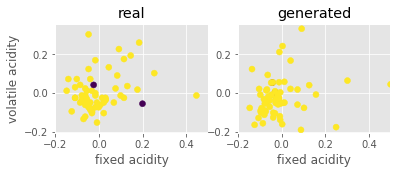

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 0.6726, 0.6602, 0.6699
D Real - D Gen: 0.0097


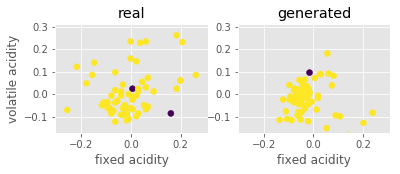

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 0.6268, 0.6269, 0.6481
D Real - D Gen: 0.0212


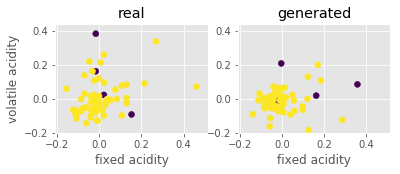

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 0.6577, 0.6411, 0.5675
D Real - D Gen: -0.0736


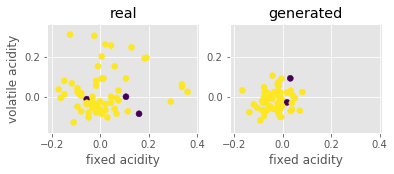

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 0.6419, 0.6802, 0.6684
D Real - D Gen: -0.0118


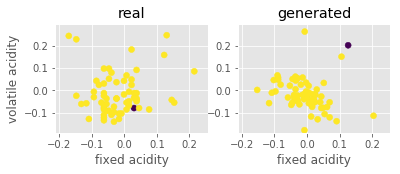

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 0.6975, 0.6393, 0.6611
D Real - D Gen: 0.0218


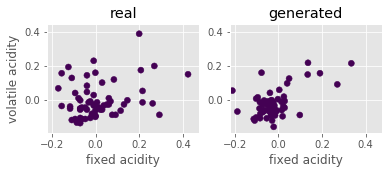

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 0.6798, 0.6412, 0.6487
D Real - D Gen: 0.0075


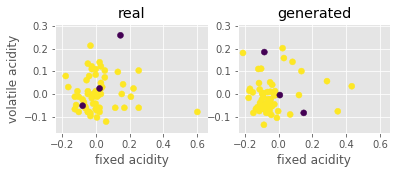

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 0.6674, 0.6242, 0.7131
D Real - D Gen: 0.0889


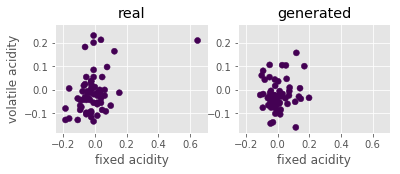

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 0.6681, 0.6500, 0.6316
D Real - D Gen: -0.0183


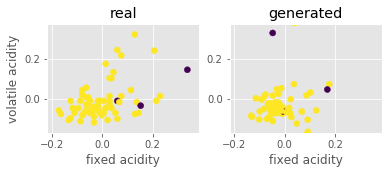

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 0.6676, 0.6744, 0.6340
D Real - D Gen: -0.0405


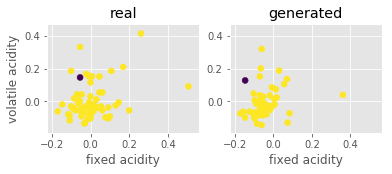

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 0.7175, 0.6450, 0.6420
D Real - D Gen: -0.0030


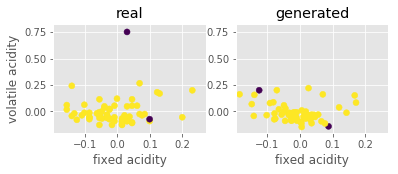

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 0.7347, 0.7022, 0.6789
D Real - D Gen: -0.0233


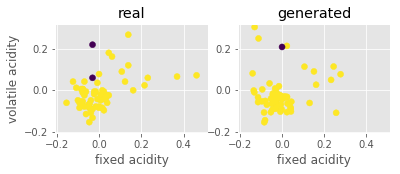

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 0.6943, 0.6717, 0.6619
D Real - D Gen: -0.0098


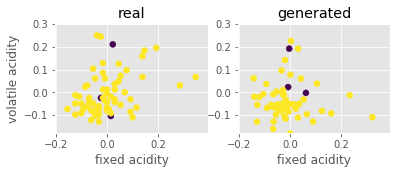

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 0.6840, 0.6466, 0.6724
D Real - D Gen: 0.0258


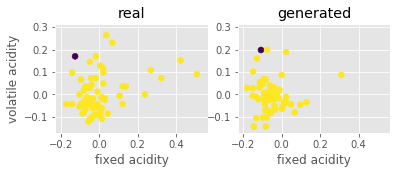

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 0.6718, 0.6347, 0.6548
D Real - D Gen: 0.0201


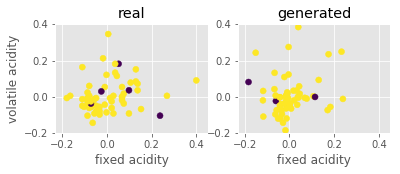

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 0.6602, 0.6806, 0.6208
D Real - D Gen: -0.0598


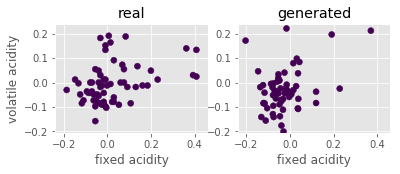

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 0.7108, 0.6948, 0.6484
D Real - D Gen: -0.0465


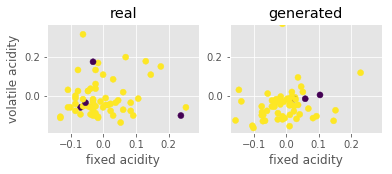

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 0.6613, 0.6443, 0.6669
D Real - D Gen: 0.0226


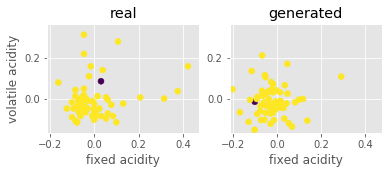

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 0.6523, 0.6598, 0.6721
D Real - D Gen: 0.0123


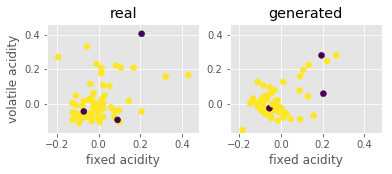

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 0.6988, 0.6502, 0.6648
D Real - D Gen: 0.0146


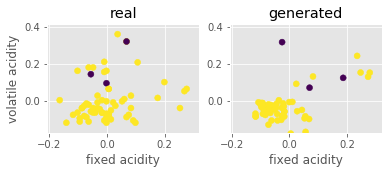

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 0.6680, 0.6668, 0.6392
D Real - D Gen: -0.0276


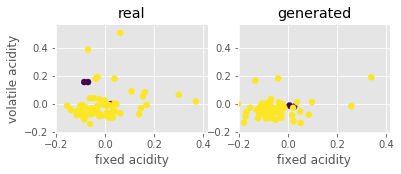

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 0.6877, 0.6893, 0.6670
D Real - D Gen: -0.0223


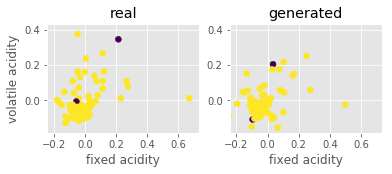

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 0.7093, 0.6458, 0.6425
D Real - D Gen: -0.0033


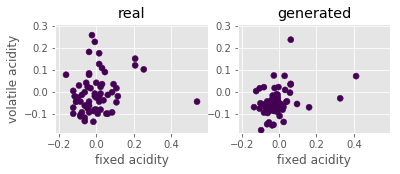

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 0.6701, 0.7042, 0.6199
D Real - D Gen: -0.0843


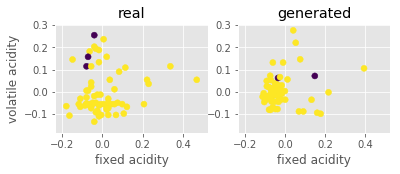

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 0.7463, 0.7033, 0.6351
D Real - D Gen: -0.0681


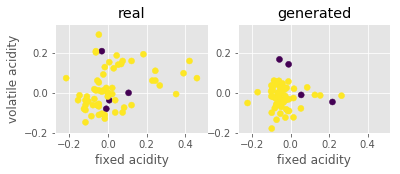

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 0.7359, 0.6573, 0.6678
D Real - D Gen: 0.0105


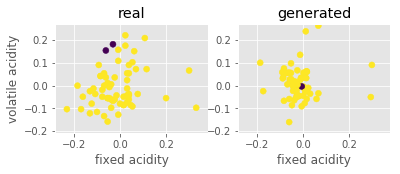

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 0.7129, 0.6797, 0.6732
D Real - D Gen: -0.0065


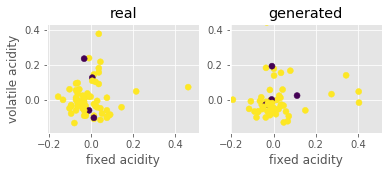

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 0.7260, 0.6481, 0.6971
D Real - D Gen: 0.0490


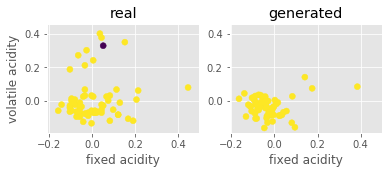

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 0.7499, 0.6649, 0.6228
D Real - D Gen: -0.0421


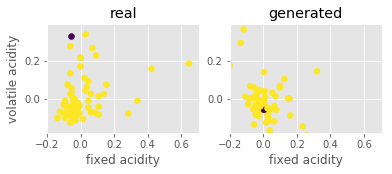

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 0.7880, 0.7079, 0.6524
D Real - D Gen: -0.0554


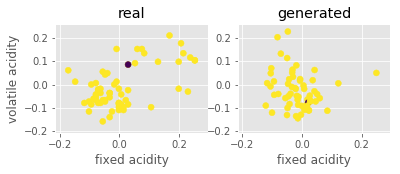

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 0.6530, 0.6752, 0.7496
D Real - D Gen: 0.0744


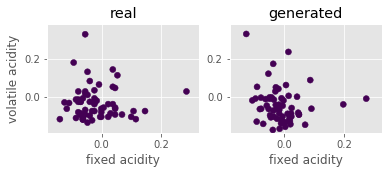

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 0.5973, 0.6374, 0.6886
D Real - D Gen: 0.0512


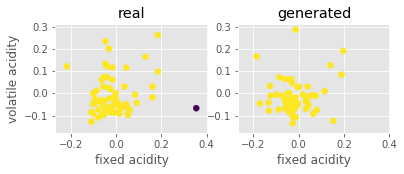

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 0.5419, 0.6548, 0.6493
D Real - D Gen: -0.0055


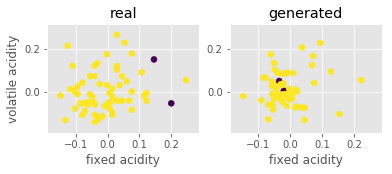

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 0.6254, 0.6286, 0.6249
D Real - D Gen: -0.0038


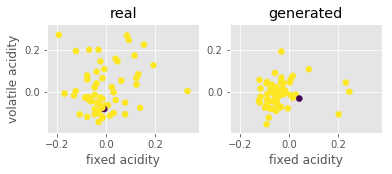

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 0.6132, 0.6242, 0.6163
D Real - D Gen: -0.0079


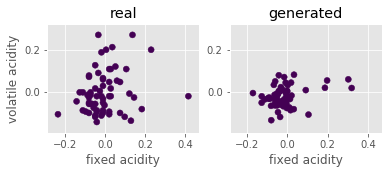

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 0.6132, 0.6700, 0.6403
D Real - D Gen: -0.0297


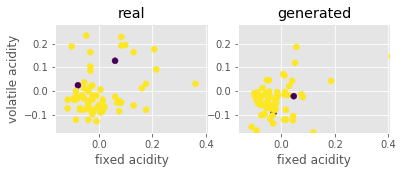

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 0.6080, 0.6467, 0.6706
D Real - D Gen: 0.0240


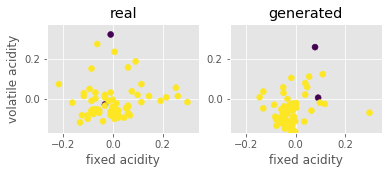

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 0.6291, 0.6268, 0.6111
D Real - D Gen: -0.0157


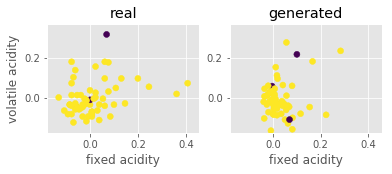

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 0.6771, 0.6477, 0.6125
D Real - D Gen: -0.0352


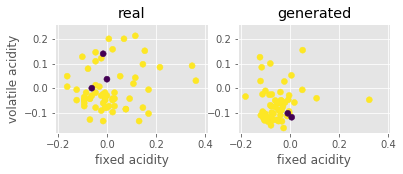

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 0.6755, 0.6279, 0.6908
D Real - D Gen: 0.0629


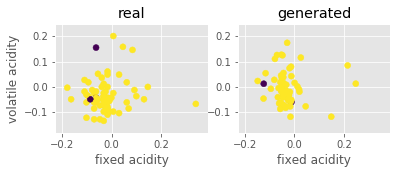

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 0.6629, 0.6494, 0.6431
D Real - D Gen: -0.0063


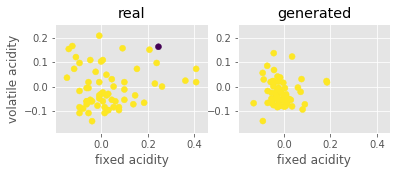

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6160, 0.6289
D Real - D Gen: 0.0129


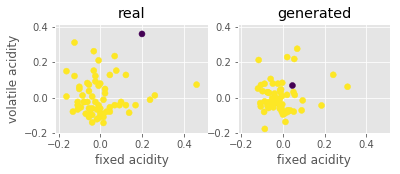

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 0.6659, 0.6293, 0.6562
D Real - D Gen: 0.0269


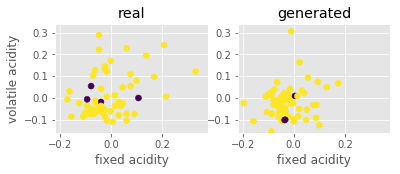

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 0.5783, 0.6217, 0.6530
D Real - D Gen: 0.0314


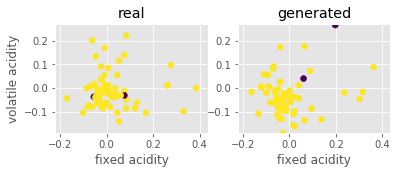

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 0.6561, 0.6114, 0.6605
D Real - D Gen: 0.0491


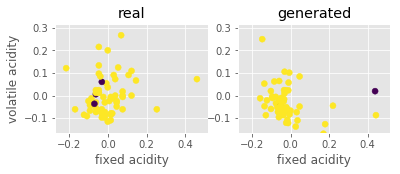

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 0.6133, 0.6528, 0.6441
D Real - D Gen: -0.0087


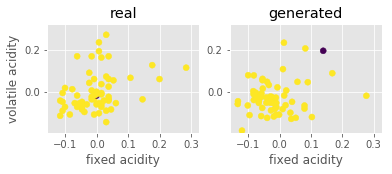

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 0.6195, 0.6177, 0.6586
D Real - D Gen: 0.0409


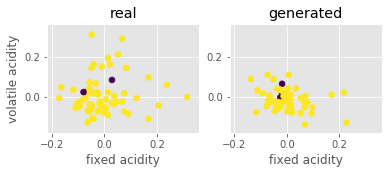

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 0.6054, 0.6391, 0.6281
D Real - D Gen: -0.0110


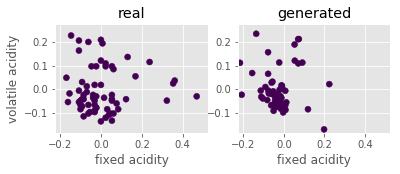

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 0.6080, 0.6653, 0.6488
D Real - D Gen: -0.0165


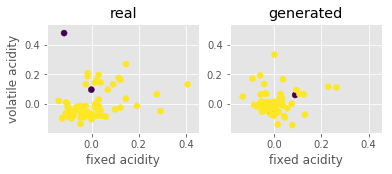

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 0.6201, 0.6177, 0.6575
D Real - D Gen: 0.0398


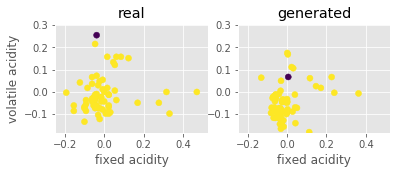

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 0.6404, 0.6680, 0.6285
D Real - D Gen: -0.0395


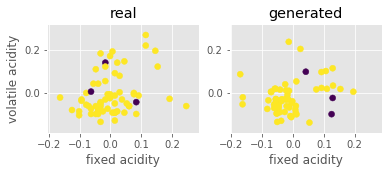

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 0.6445, 0.6513, 0.6389
D Real - D Gen: -0.0124


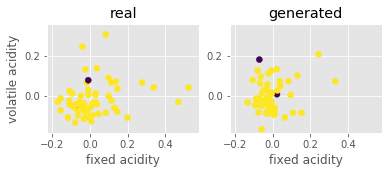

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 0.6064, 0.6434, 0.7100
D Real - D Gen: 0.0666


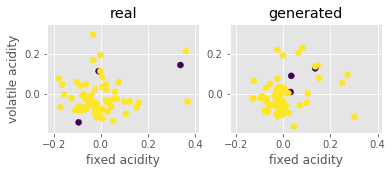

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 0.6192, 0.6737, 0.6561
D Real - D Gen: -0.0175


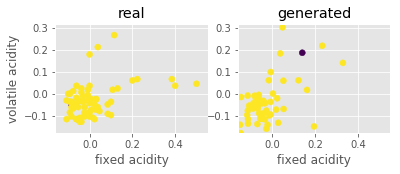

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 0.6414, 0.6124, 0.6550
D Real - D Gen: 0.0426


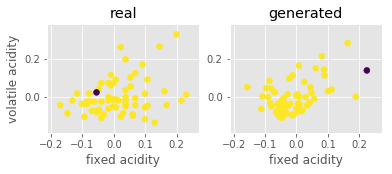

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 0.6343, 0.6594, 0.6454
D Real - D Gen: -0.0140


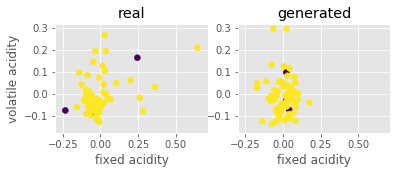

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 0.6088, 0.6301, 0.6499
D Real - D Gen: 0.0198


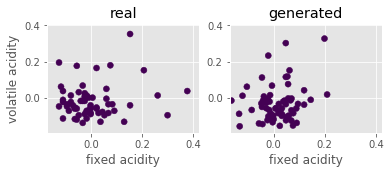

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 0.6039, 0.6523, 0.6739
D Real - D Gen: 0.0216


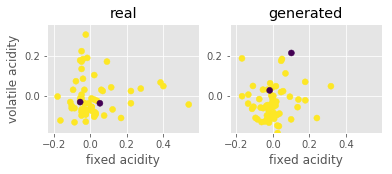

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 0.6283, 0.6661, 0.6729
D Real - D Gen: 0.0068


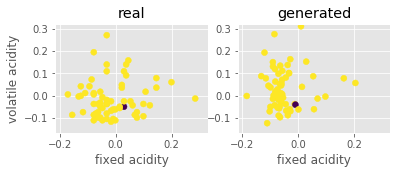

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 0.6665, 0.6647, 0.6152
D Real - D Gen: -0.0495


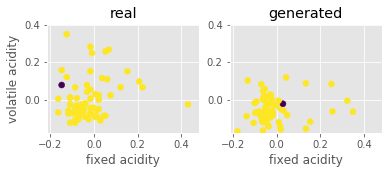

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 0.6705, 0.6494, 0.6473
D Real - D Gen: -0.0021


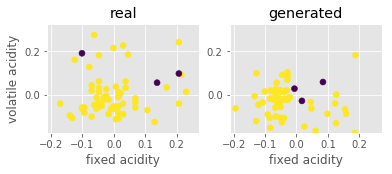

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.6433, 0.6815
D Real - D Gen: 0.0382


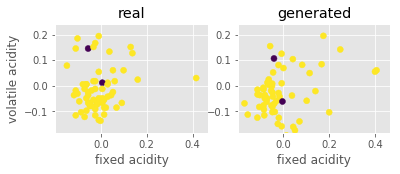

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 0.6888, 0.6942, 0.6787
D Real - D Gen: -0.0155


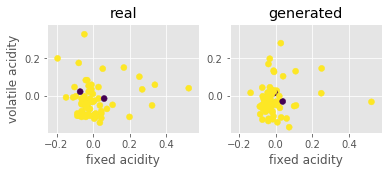

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.6579, 0.6063
D Real - D Gen: -0.0516


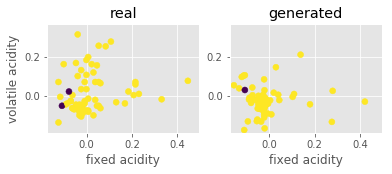

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 0.6417, 0.6512, 0.7028
D Real - D Gen: 0.0516


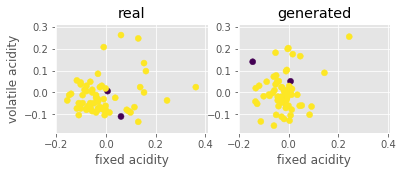

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 0.6409, 0.6383, 0.6653
D Real - D Gen: 0.0270


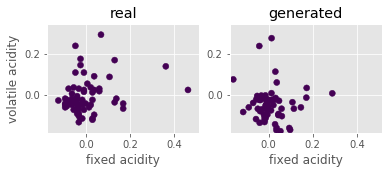

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 0.6155, 0.6573, 0.6022
D Real - D Gen: -0.0551


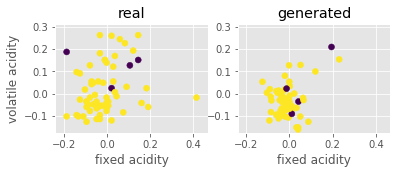

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 0.6313, 0.6784, 0.6614
D Real - D Gen: -0.0170


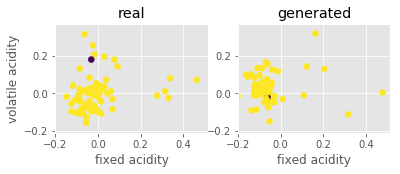

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 0.6675, 0.6775, 0.6737
D Real - D Gen: -0.0038


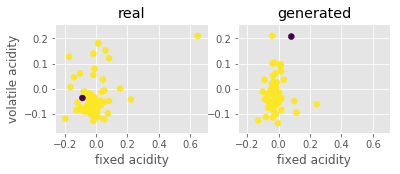

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 0.6679, 0.6472, 0.6449
D Real - D Gen: -0.0023


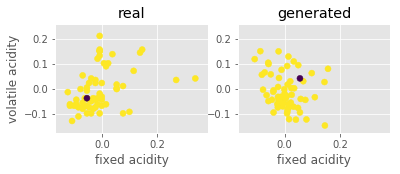

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 0.6621, 0.6435, 0.6283
D Real - D Gen: -0.0152


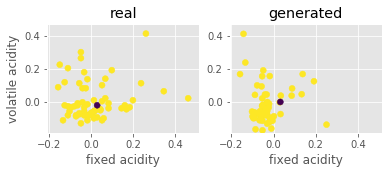

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 0.6257, 0.6507, 0.6395
D Real - D Gen: -0.0112


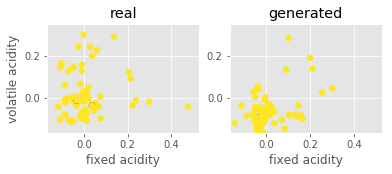

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 0.6353, 0.6450, 0.6518
D Real - D Gen: 0.0068


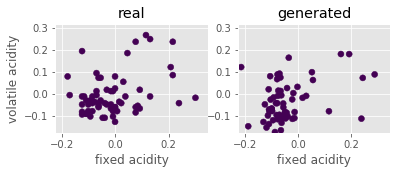

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 0.6775, 0.6523, 0.6712
D Real - D Gen: 0.0189


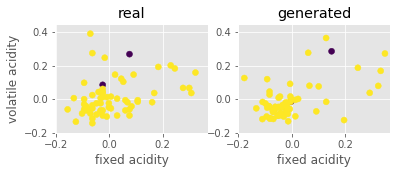

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 0.6468, 0.6669, 0.6322
D Real - D Gen: -0.0347


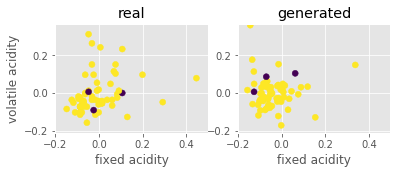

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 0.6760, 0.6373, 0.6470
D Real - D Gen: 0.0097


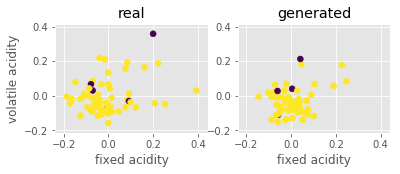

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 0.6656, 0.6506, 0.6296
D Real - D Gen: -0.0209


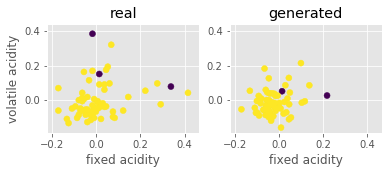

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 0.6839, 0.6799, 0.6745
D Real - D Gen: -0.0053


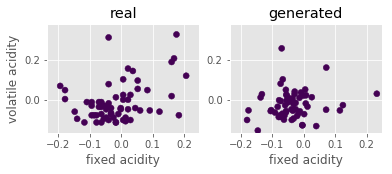

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 0.6524, 0.6448, 0.6606
D Real - D Gen: 0.0157


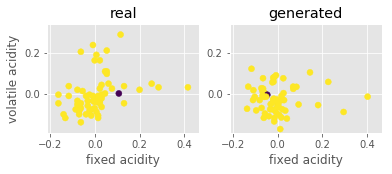

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 0.6980, 0.6987, 0.6528
D Real - D Gen: -0.0459


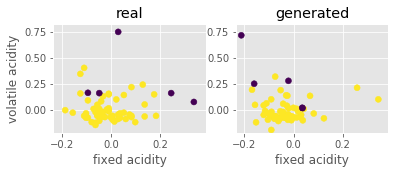

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 0.6894, 0.6518, 0.6739
D Real - D Gen: 0.0221


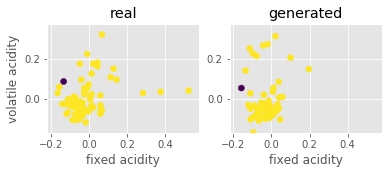

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 0.6362, 0.6223, 0.6598
D Real - D Gen: 0.0375


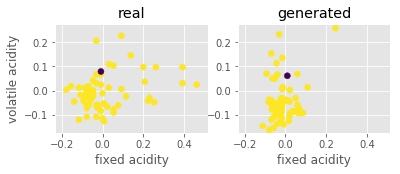

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 0.6793, 0.6718, 0.6847
D Real - D Gen: 0.0129


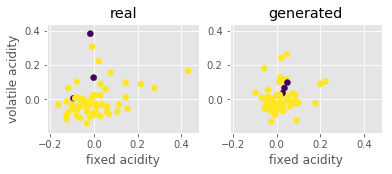

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 0.6594, 0.6958, 0.6694
D Real - D Gen: -0.0265


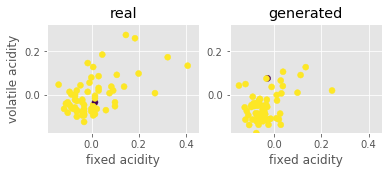

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 0.6953, 0.6559, 0.6657
D Real - D Gen: 0.0098


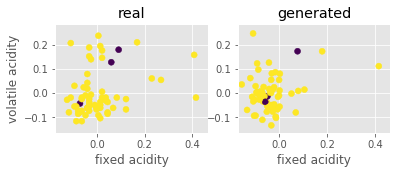

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 0.6960, 0.6702, 0.6195
D Real - D Gen: -0.0507


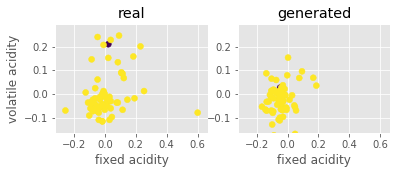

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 0.6453, 0.6681, 0.6292
D Real - D Gen: -0.0389


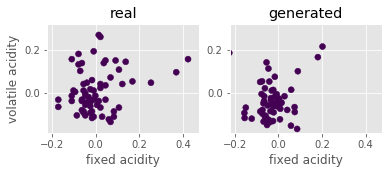

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.6611, 0.6909
D Real - D Gen: 0.0298


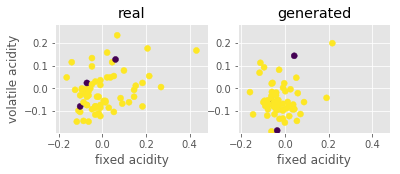

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 0.6805, 0.6549, 0.6640
D Real - D Gen: 0.0090


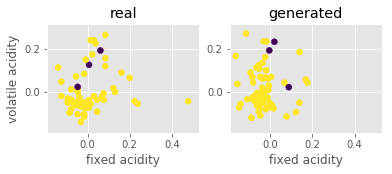

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 0.6914, 0.6188, 0.5952
D Real - D Gen: -0.0235


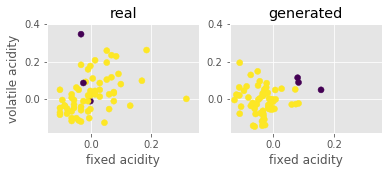

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 0.7176, 0.6695, 0.6883
D Real - D Gen: 0.0189


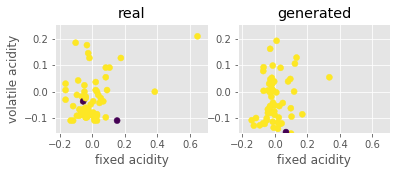

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 0.7068, 0.7414, 0.7034
D Real - D Gen: -0.0380


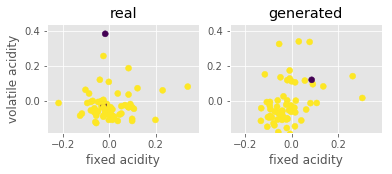

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 0.7000, 0.6960, 0.6656
D Real - D Gen: -0.0304


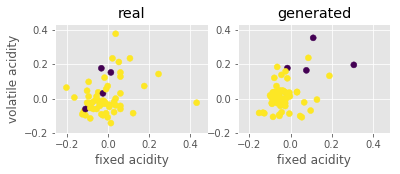

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 0.7087, 0.6379, 0.6773
D Real - D Gen: 0.0394


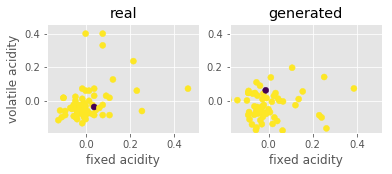

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 0.6821, 0.6842, 0.6432
D Real - D Gen: -0.0409


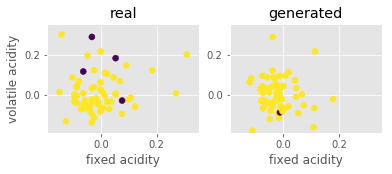

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 0.7384, 0.6647, 0.6784
D Real - D Gen: 0.0137


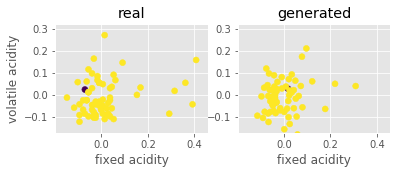

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 0.7188, 0.7299, 0.6598
D Real - D Gen: -0.0701


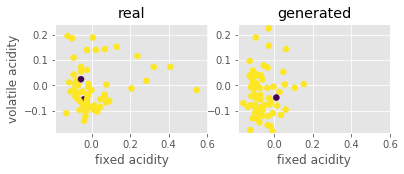

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 0.6393, 0.6375, 0.7153
D Real - D Gen: 0.0779


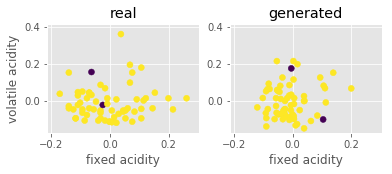

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 0.6424, 0.6610, 0.6488
D Real - D Gen: -0.0122


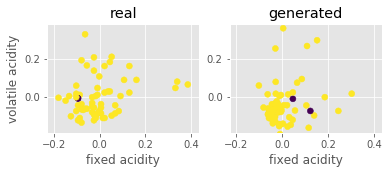

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 0.6392, 0.6450, 0.6825
D Real - D Gen: 0.0375


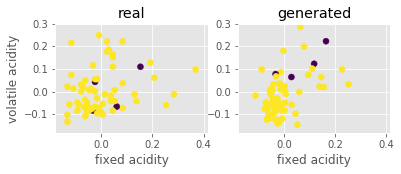

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 0.6526, 0.6004, 0.6320
D Real - D Gen: 0.0316


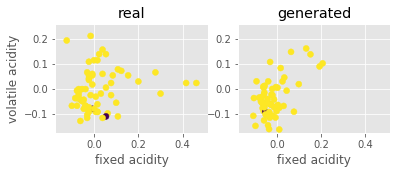

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 0.6455, 0.6104, 0.6159
D Real - D Gen: 0.0055


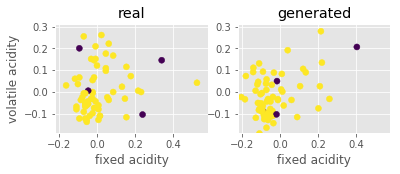

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.6405, 0.6673
D Real - D Gen: 0.0268


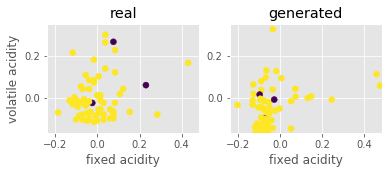

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 0.6494, 0.6373, 0.6503
D Real - D Gen: 0.0130


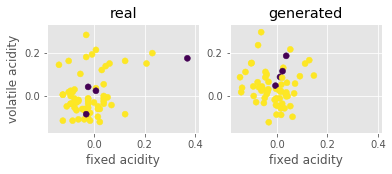

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 0.6592, 0.6451, 0.6360
D Real - D Gen: -0.0091


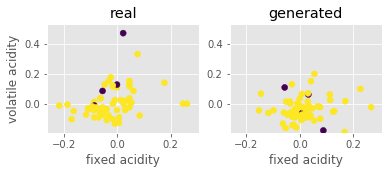

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 0.6575, 0.6267, 0.6567
D Real - D Gen: 0.0301


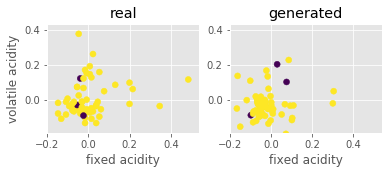

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 0.6423, 0.6436, 0.6308
D Real - D Gen: -0.0129


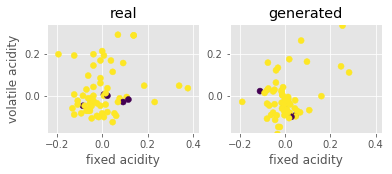

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 0.6628, 0.6442, 0.6549
D Real - D Gen: 0.0107


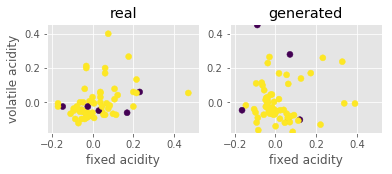

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 0.6222, 0.6582, 0.6152
D Real - D Gen: -0.0430


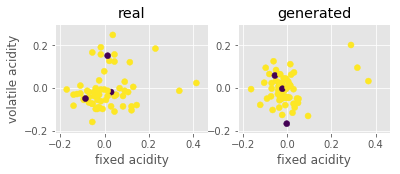

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 0.6440, 0.5962, 0.6455
D Real - D Gen: 0.0494


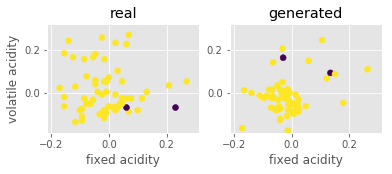

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 0.6216, 0.6349, 0.6178
D Real - D Gen: -0.0171


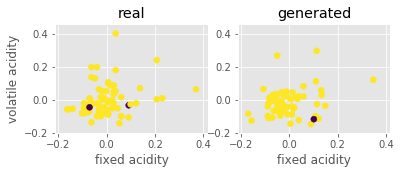

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 0.6108, 0.6875, 0.6458
D Real - D Gen: -0.0416


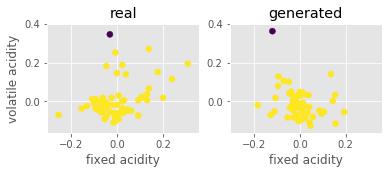

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 0.6434, 0.6083, 0.5959
D Real - D Gen: -0.0124


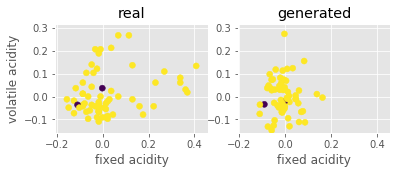

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 0.5804, 0.6376, 0.6909
D Real - D Gen: 0.0533


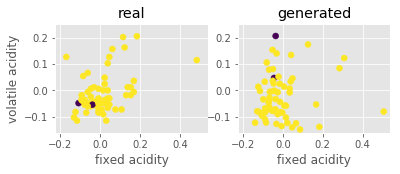

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 0.5879, 0.6453, 0.6581
D Real - D Gen: 0.0128


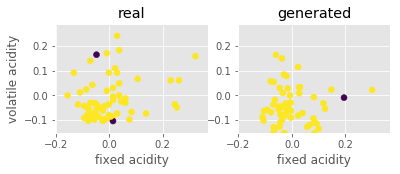

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 0.6304, 0.6375, 0.6227
D Real - D Gen: -0.0147


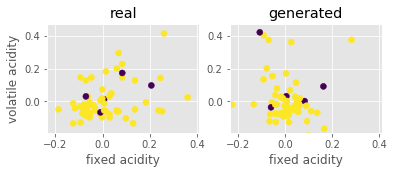

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 0.6014, 0.6602, 0.6749
D Real - D Gen: 0.0147


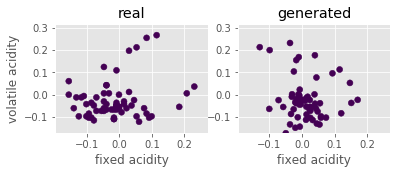

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 0.6413, 0.6291, 0.6168
D Real - D Gen: -0.0123


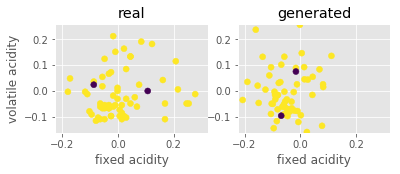

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 0.6336, 0.6349, 0.6207
D Real - D Gen: -0.0141


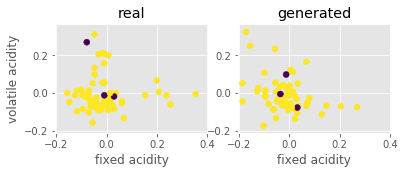

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 0.5999, 0.6619, 0.6737
D Real - D Gen: 0.0118


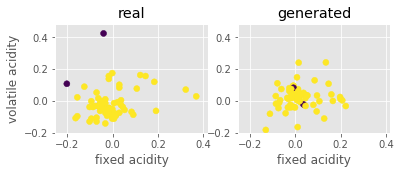

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 0.6366, 0.6587, 0.6628
D Real - D Gen: 0.0041


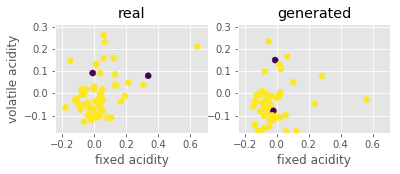

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 0.6159, 0.6657, 0.5925
D Real - D Gen: -0.0733


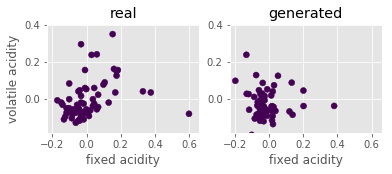

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 0.6418, 0.6221, 0.6553
D Real - D Gen: 0.0332


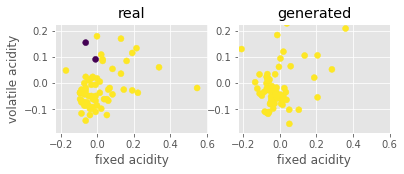

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 0.6353, 0.6569, 0.6810
D Real - D Gen: 0.0241


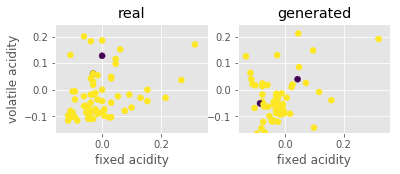

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 0.6476, 0.6362, 0.6451
D Real - D Gen: 0.0089


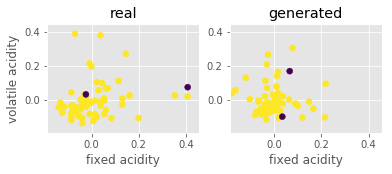

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 0.6202, 0.6477, 0.6456
D Real - D Gen: -0.0021


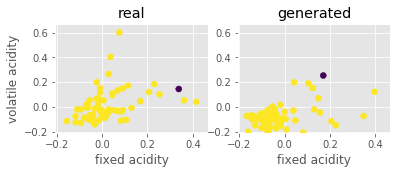

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 0.5953, 0.6232, 0.6600
D Real - D Gen: 0.0369


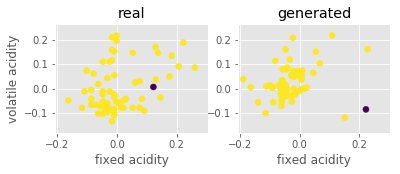

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 0.6333, 0.6998, 0.6546
D Real - D Gen: -0.0452


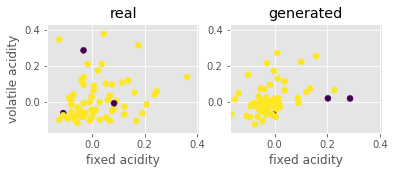

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 0.6698, 0.6756, 0.6477
D Real - D Gen: -0.0279


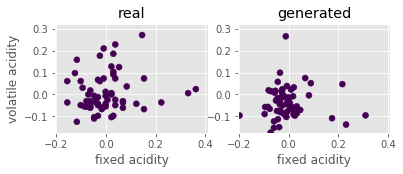

Wall time: 15min 17s


In [41]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [42]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100 
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/wine/CGAN_generator_model_weights_step_50000.h5')


In [43]:
# Now generate some new data

test_size = 6497 

z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = data[label_cols]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [46]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

real_samples.to_excel('./data/wine/real.xlsx')
fake_samples.to_excel('./data/wine/fake.xlsx')

In [2]:
real_samples = pd.read_excel('./data/wine/real.xlsx')
fake_samples = pd.read_excel('./data/wine/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [3]:
pearson = real_samples.corrwith(fake_samples)
pearson.to_excel('./res.xlsx')
pearson

Unnamed: 0              1.000000
fixed acidity           0.010788
volatile acidity        0.021730
citric acid             0.012923
residual sugar         -0.001662
chlorides              -0.007161
free sulfur dioxide     0.024933
total sulfur dioxide   -0.003722
density                -0.002811
pH                     -0.006589
sulphates              -0.003954
alcohol                 0.000138
quality_note            1.000000
dtype: float64

## Covariance

In [14]:
columnas = real_samples.columns.values
covarianza = []
for col in columnas:
    covarianza.append(np.cov(real_samples[col], fake_samples[col])[0][1])
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    
pd.Series(covarianza).to_excel('./res.xlsx')
    

fixed acidity:       0.0009779825742606664
volatile acidity:       0.0018709813646250897
citric acid:       0.0012379332591189475
residual sugar:       -0.00018490719747916643
chlorides:       -0.0007537852279877776
free sulfur dioxide:       0.002287272125708651
total sulfur dioxide:       -0.00035919143686820174
density:       -0.0002942453290766163
pH:       -0.0006834848691545016
sulphates:       -0.00046633739613859913
alcohol:       1.3918827358689959e-05
quality_note:       0.03643558300117297


## Spearman's Correlation

In [15]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
spearman = []
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    spearman.append(spr)
    print(col + ":       " + str(spr) )
    
pd.Series(spearman).to_excel('./res.xlsx')

fixed acidity:       0.011836893222098955
volatile acidity:       0.008616818733240859
citric acid:       0.0007716424171953694
residual sugar:       0.001105483190798869
chlorides:       0.005280367411141852
free sulfur dioxide:       0.023226161437771745
total sulfur dioxide:       0.0017568553701148265
density:       -0.0034236381677761082
pH:       -0.004015788078627895
sulphates:       -0.0021648899392774173
alcohol:       -0.007400738831206188
quality_note:       0.9999999999999998


# XGBoost

## CV with real data

In [38]:
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.9602887338986591
F1-Score XGBoost CV:  0.9797102997165936
ROC AUC XGBoost CV:  0.786627062757957


## CV with generated data

In [52]:
# Generated data
X = fake_samples.drop(columns=["quality_note"])
y = fake_samples["quality_note"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.9627519306224441
F1-Score XGBoost CV:  0.9809468811986684
ROC AUC XGBoost CV:  0.8598364449664759


## CV with the two datasets joined

In [53]:
from sklearn.utils import shuffle
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/wine/real_fake.xlsx')

In [55]:
xgbo_cv(data.drop(columns=['quality_note']), data.quality_note.values.ravel())

Accuracy XGBoost CV:  0.9616746017646711
F1-Score XGBoost CV:  0.980456798408422
ROC AUC XGBoost CV:  0.8339578846622555
